In [ ]:
import numpy as np
import keras as ke
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow import reshape
from tensorflow.keras import Model,backend
from keras.models import Sequential
from matplotlib.pyplot import figure
from sklearn.metrics import mean_squared_error
import gc
import pandas as pd

In [ ]:
p= 100; 
n = 600;
sigma_2 = 0.5;
delta = 0.1;
seed = 100;
epochs = 100;

In [ ]:
train_loss_1 = np.zeros((epochs,seed))
test_loss_1 = np.zeros((epochs,seed))
train_loss_2 = np.zeros((epochs,seed))
test_loss_2 = np.zeros((epochs,seed))
train_loss_3 = np.zeros((epochs,seed))
test_loss_3 = np.zeros((epochs,seed))
train_loss_4 = np.zeros((epochs,seed))
test_loss_4 = np.zeros((epochs,seed))
train_loss_5 = np.zeros((epochs,seed))
test_loss_5 = np.zeros((epochs,seed))
train_loss_6 = np.zeros((epochs,seed))
test_loss_6 = np.zeros((epochs,seed))

In [ ]:
mean_square_error_1 = [];
mean_square_error_2 = [];
mean_square_error_3 = [];
mean_square_error_4 = [];
mean_square_error_5 = [];
mean_square_error_6 = [];

In [ ]:
def create_model_1(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model


In [ ]:
def create_model_2(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_3(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),        
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_4(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),        
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_5(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),  
        tf.keras.layers.Dense(p/2, activation="relu"),        
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_6(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),  
        tf.keras.layers.Dense(p/2, activation="relu"),        
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def simulation_processing(loss_file):

  loss = pd.DataFrame(loss_file)
  loss['min'] = loss.min(axis=1)
  loss['max'] = loss.max(axis=1)
  loss['mean'] = loss.mean(axis=1)
  loss['std'] = loss.std(axis=1)

  return loss

In [ ]:
def plot_seeds(loss):
  plt.figure(figsize=(10, 10))
  plt.plot(loss)
  plt.title('All seeds loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend()
  
  return plt.show()


In [ ]:
for f in range(0,seed):
  A = np.random.rand(p,p)
  n_max = np.amax(A)
  phi = A/((1+delta)*n_max)
  X = np.random.standard_normal(p)
  X_t = np.zeros((n+100,p))

  for i in range(0,n+100):
    E_t = np.random.uniform(0,sigma_2,p)
    XX = np.zeros((p,p));
    XX[0,:] = X[:];
    aa = phi*XX + E_t;
    X_t[i,:] = aa[0,:];
    X = X_t[i,:];

  X_tt = X_t[100:,:]
  X_train = X_tt[:499,:]
  y_train = X_tt[1:500,:]
  X_test = X_tt[499:599,:]
  Y_test = X_tt[500:,:]

  model_1 = create_model_1(p)
  history = model_1.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_1[:,f] = history.history['loss']
  test_loss_1[:,f] = history.history['val_loss']

  model_2 = create_model_2(p)
  history = model_2.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_2[:,f] = history.history['loss']
  test_loss_2[:,f] = history.history['val_loss']

  model_3 = create_model_3(p)
  history = model_3.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_3[:,f] = history.history['loss']
  test_loss_3[:,f] = history.history['val_loss']

  model_4 = create_model_4(p)
  history = model_4.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_4[:,f] = history.history['loss']
  test_loss_4[:,f] = history.history['val_loss']

  model_5 = create_model_5(p)
  history = model_5.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_5[:,f] = history.history['loss']
  test_loss_5[:,f] = history.history['val_loss']

  model_6 = create_model_6(p)
  history = model_6.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_6[:,f] = history.history['loss']
  test_loss_6[:,f] = history.history['val_loss']

  mean_square_error_1.append(mean_squared_error(Y_test,model_1.predict(X_test)))
  mean_square_error_2.append(mean_squared_error(Y_test,model_2.predict(X_test)))
  mean_square_error_3.append(mean_squared_error(Y_test,model_3.predict(X_test)))
  mean_square_error_4.append(mean_squared_error(Y_test,model_4.predict(X_test)))
  mean_square_error_5.append(mean_squared_error(Y_test,model_5.predict(X_test)))
  mean_square_error_6.append(mean_squared_error(Y_test,model_6.predict(X_test)))

  del model_1
  del model_2
  del model_3
  del model_4
  del model_5
  del model_6
  del history
  del A
  del n_max
  del X
  del X_t




/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
16/16 - 2s - loss: 0.3925 - val_loss: 0.3257 - 2s/epoch - 99ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2948 - val_loss: 0.2821 - 102ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2749 - val_loss: 0.2759 - 240ms/epoch - 15ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2706 - val_loss: 0.2732 - 147ms/epoch - 9ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2706 - val_loss: 0.2767 - 125ms/epoch - 8ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2701 - val_loss: 0.2727 - 130ms/epoch - 8ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2691 - val_loss: 0.2723 - 146ms/epoch - 9ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2688 - val_loss: 0.2732 - 139ms/epoch - 9ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2685 - val_loss: 0.2728 - 135ms/epoch - 8ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2684 - val_loss: 0.2725 - 155ms/epoch - 10ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2681 - val_loss: 0.2715 - 151ms/epoch - 9ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2692 - val_loss: 0.2738 - 108ms/epoch - 7ms/step
Epoch 13/100


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3232 - val_loss: 0.2654 - 587ms/epoch - 37ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2573 - val_loss: 0.2579 - 76ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2508 - val_loss: 0.2534 - 75ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2481 - val_loss: 0.2507 - 74ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2460 - val_loss: 0.2514 - 66ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2456 - val_loss: 0.2503 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2447 - val_loss: 0.2511 - 77ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2451 - val_loss: 0.2505 - 63ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2451 - val_loss: 0.2525 - 57ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2444 - val_loss: 0.2500 - 58ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2436 - val_loss: 0.2510 - 59ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2441 - val_loss: 0.2497 - 57ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3378 - val_loss: 0.2648 - 605ms/epoch - 38ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2658 - val_loss: 0.2560 - 86ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2602 - val_loss: 0.2512 - 78ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2589 - val_loss: 0.2523 - 83ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2590 - val_loss: 0.2527 - 62ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2582 - val_loss: 0.2514 - 75ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2575 - val_loss: 0.2514 - 70ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2572 - val_loss: 0.2506 - 66ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2561 - val_loss: 0.2477 - 82ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2532 - val_loss: 0.2466 - 63ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2525 - val_loss: 0.2473 - 60ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2521 - val_loss: 0.2468 - 81ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3681 - val_loss: 0.3012 - 516ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2897 - val_loss: 0.2765 - 76ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2809 - val_loss: 0.2728 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2790 - val_loss: 0.2721 - 60ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2779 - val_loss: 0.2715 - 75ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2772 - val_loss: 0.2714 - 77ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2779 - val_loss: 0.2730 - 72ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2778 - val_loss: 0.2717 - 65ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2773 - val_loss: 0.2727 - 75ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2745 - val_loss: 0.2718 - 71ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2739 - val_loss: 0.2699 - 78ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2752 - val_loss: 0.2756 - 64ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3308 - val_loss: 0.2711 - 519ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2603 - val_loss: 0.2552 - 66ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2409 - val_loss: 0.2369 - 57ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2335 - val_loss: 0.2358 - 67ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2315 - val_loss: 0.2343 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2302 - val_loss: 0.2315 - 61ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2275 - val_loss: 0.2289 - 61ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2270 - val_loss: 0.2316 - 71ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2278 - val_loss: 0.2292 - 81ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2261 - val_loss: 0.2296 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2255 - val_loss: 0.2270 - 76ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2229 - val_loss: 0.2259 - 79ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3946 - val_loss: 0.2947 - 524ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2876 - val_loss: 0.2814 - 57ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2748 - val_loss: 0.2690 - 78ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2669 - val_loss: 0.2653 - 57ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2641 - val_loss: 0.2646 - 64ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2634 - val_loss: 0.2649 - 60ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2632 - val_loss: 0.2663 - 60ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2622 - val_loss: 0.2634 - 65ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2611 - val_loss: 0.2619 - 66ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2619 - val_loss: 0.2623 - 64ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2608 - val_loss: 0.2626 - 61ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2611 - val_loss: 0.2630 - 64ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3883 - val_loss: 0.2927 - 528ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2593 - val_loss: 0.2531 - 84ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2458 - val_loss: 0.2508 - 73ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2435 - val_loss: 0.2481 - 60ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2426 - val_loss: 0.2478 - 58ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2426 - val_loss: 0.2484 - 78ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2418 - val_loss: 0.2486 - 71ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2418 - val_loss: 0.2474 - 67ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2413 - val_loss: 0.2483 - 61ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2400 - val_loss: 0.2456 - 60ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2395 - val_loss: 0.2457 - 67ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2405 - val_loss: 0.2507 - 66ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3916 - val_loss: 0.2805 - 535ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2733 - val_loss: 0.2689 - 70ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2646 - val_loss: 0.2613 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2591 - val_loss: 0.2602 - 80ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2581 - val_loss: 0.2595 - 92ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2579 - val_loss: 0.2583 - 67ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2578 - val_loss: 0.2609 - 78ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2578 - val_loss: 0.2577 - 69ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2567 - val_loss: 0.2585 - 66ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2572 - val_loss: 0.2600 - 78ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2562 - val_loss: 0.2581 - 62ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2557 - val_loss: 0.2593 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3082 - val_loss: 0.2093 - 512ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2004 - val_loss: 0.1927 - 68ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1902 - val_loss: 0.1919 - 67ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1894 - val_loss: 0.1898 - 77ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1894 - val_loss: 0.1895 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1882 - val_loss: 0.1915 - 63ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1880 - val_loss: 0.1905 - 68ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1883 - val_loss: 0.1892 - 75ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1883 - val_loss: 0.1895 - 78ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1877 - val_loss: 0.1895 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1879 - val_loss: 0.1891 - 71ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1875 - val_loss: 0.1890 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3289 - val_loss: 0.2535 - 533ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2481 - val_loss: 0.2448 - 64ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2396 - val_loss: 0.2375 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2353 - val_loss: 0.2366 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2351 - val_loss: 0.2364 - 65ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2359 - val_loss: 0.2375 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2351 - val_loss: 0.2359 - 66ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2350 - val_loss: 0.2358 - 75ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2345 - val_loss: 0.2355 - 73ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2339 - val_loss: 0.2354 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2337 - val_loss: 0.2352 - 90ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2335 - val_loss: 0.2364 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4061 - val_loss: 0.3382 - 509ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3149 - val_loss: 0.3270 - 63ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3115 - val_loss: 0.3220 - 60ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3090 - val_loss: 0.3225 - 69ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3081 - val_loss: 0.3204 - 62ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3079 - val_loss: 0.3205 - 59ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3085 - val_loss: 0.3204 - 64ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3078 - val_loss: 0.3224 - 78ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3062 - val_loss: 0.3190 - 61ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3059 - val_loss: 0.3192 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3056 - val_loss: 0.3215 - 71ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3050 - val_loss: 0.3209 - 71ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.3

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3775 - val_loss: 0.2887 - 525ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2763 - val_loss: 0.2731 - 82ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2685 - val_loss: 0.2743 - 68ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2678 - val_loss: 0.2706 - 64ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2665 - val_loss: 0.2697 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2668 - val_loss: 0.2737 - 61ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2671 - val_loss: 0.2714 - 69ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2661 - val_loss: 0.2701 - 64ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2658 - val_loss: 0.2687 - 98ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2648 - val_loss: 0.2692 - 68ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2645 - val_loss: 0.2707 - 63ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2649 - val_loss: 0.2694 - 69ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3994 - val_loss: 0.3057 - 517ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2857 - val_loss: 0.2723 - 65ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2681 - val_loss: 0.2659 - 72ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2652 - val_loss: 0.2678 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2642 - val_loss: 0.2698 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2652 - val_loss: 0.2655 - 90ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2626 - val_loss: 0.2626 - 83ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2602 - val_loss: 0.2626 - 98ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2604 - val_loss: 0.2633 - 72ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2602 - val_loss: 0.2614 - 67ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2591 - val_loss: 0.2610 - 88ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2593 - val_loss: 0.2603 - 69ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4112 - val_loss: 0.2981 - 569ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2933 - val_loss: 0.2855 - 70ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2833 - val_loss: 0.2790 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2794 - val_loss: 0.2806 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2788 - val_loss: 0.2764 - 88ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2777 - val_loss: 0.2768 - 92ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2773 - val_loss: 0.2762 - 74ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2783 - val_loss: 0.2772 - 70ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2772 - val_loss: 0.2775 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2772 - val_loss: 0.2779 - 89ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2767 - val_loss: 0.2760 - 86ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2775 - val_loss: 0.2776 - 88ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3757 - val_loss: 0.2713 - 528ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2464 - val_loss: 0.2373 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2340 - val_loss: 0.2350 - 66ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2310 - val_loss: 0.2323 - 67ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2291 - val_loss: 0.2298 - 69ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2275 - val_loss: 0.2289 - 73ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2264 - val_loss: 0.2282 - 64ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2256 - val_loss: 0.2269 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2257 - val_loss: 0.2268 - 82ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2250 - val_loss: 0.2287 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2266 - val_loss: 0.2307 - 70ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2262 - val_loss: 0.2269 - 73ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4410 - val_loss: 0.3454 - 503ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3268 - val_loss: 0.3223 - 79ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3152 - val_loss: 0.3196 - 69ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3123 - val_loss: 0.3187 - 68ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3116 - val_loss: 0.3139 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3044 - val_loss: 0.3101 - 66ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3027 - val_loss: 0.3090 - 91ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3017 - val_loss: 0.3005 - 69ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2844 - val_loss: 0.2877 - 84ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2814 - val_loss: 0.2863 - 74ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2797 - val_loss: 0.2865 - 93ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2799 - val_loss: 0.2848 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4039 - val_loss: 0.3201 - 918ms/epoch - 57ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3049 - val_loss: 0.2930 - 69ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2929 - val_loss: 0.2931 - 72ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2906 - val_loss: 0.2965 - 73ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2904 - val_loss: 0.2906 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2895 - val_loss: 0.2900 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2889 - val_loss: 0.2908 - 70ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2890 - val_loss: 0.2921 - 67ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2898 - val_loss: 0.2933 - 76ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2881 - val_loss: 0.2886 - 73ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2877 - val_loss: 0.2884 - 95ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2874 - val_loss: 0.2943 - 73ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3955 - val_loss: 0.3020 - 530ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2870 - val_loss: 0.2837 - 65ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2788 - val_loss: 0.2834 - 71ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2763 - val_loss: 0.2805 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2765 - val_loss: 0.2812 - 67ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2756 - val_loss: 0.2799 - 76ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2745 - val_loss: 0.2788 - 90ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2744 - val_loss: 0.2797 - 67ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2740 - val_loss: 0.2808 - 72ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2746 - val_loss: 0.2795 - 71ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2737 - val_loss: 0.2798 - 82ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2731 - val_loss: 0.2792 - 70ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3265 - val_loss: 0.2637 - 532ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2506 - val_loss: 0.2494 - 70ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2445 - val_loss: 0.2488 - 71ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2428 - val_loss: 0.2436 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2376 - val_loss: 0.2427 - 69ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2366 - val_loss: 0.2402 - 74ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2351 - val_loss: 0.2410 - 92ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2361 - val_loss: 0.2412 - 99ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2355 - val_loss: 0.2397 - 86ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2349 - val_loss: 0.2398 - 71ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2343 - val_loss: 0.2410 - 80ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2288 - val_loss: 0.2300 - 71ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3865 - val_loss: 0.2821 - 521ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2563 - val_loss: 0.2416 - 83ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2337 - val_loss: 0.2384 - 74ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2308 - val_loss: 0.2400 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2302 - val_loss: 0.2384 - 78ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2290 - val_loss: 0.2357 - 95ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2291 - val_loss: 0.2372 - 94ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2290 - val_loss: 0.2375 - 80ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2282 - val_loss: 0.2356 - 70ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2287 - val_loss: 0.2366 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2284 - val_loss: 0.2365 - 89ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2282 - val_loss: 0.2348 - 73ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3456 - val_loss: 0.2763 - 525ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2587 - val_loss: 0.2541 - 99ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2502 - val_loss: 0.2525 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2467 - val_loss: 0.2478 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2463 - val_loss: 0.2489 - 74ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2446 - val_loss: 0.2464 - 71ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2440 - val_loss: 0.2475 - 97ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2441 - val_loss: 0.2479 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2438 - val_loss: 0.2464 - 78ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2418 - val_loss: 0.2432 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2402 - val_loss: 0.2446 - 90ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2408 - val_loss: 0.2432 - 90ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3881 - val_loss: 0.2668 - 521ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2534 - val_loss: 0.2400 - 70ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2358 - val_loss: 0.2335 - 76ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2316 - val_loss: 0.2313 - 98ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2308 - val_loss: 0.2306 - 71ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2298 - val_loss: 0.2294 - 78ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2294 - val_loss: 0.2308 - 93ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2292 - val_loss: 0.2300 - 80ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2289 - val_loss: 0.2301 - 93ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2293 - val_loss: 0.2304 - 99ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2292 - val_loss: 0.2307 - 78ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2282 - val_loss: 0.2288 - 89ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3886 - val_loss: 0.2777 - 540ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2685 - val_loss: 0.2599 - 94ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2600 - val_loss: 0.2577 - 84ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2584 - val_loss: 0.2582 - 89ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2573 - val_loss: 0.2547 - 87ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2570 - val_loss: 0.2591 - 98ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2569 - val_loss: 0.2553 - 90ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2567 - val_loss: 0.2563 - 98ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2570 - val_loss: 0.2570 - 91ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2568 - val_loss: 0.2572 - 95ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2556 - val_loss: 0.2534 - 77ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2553 - val_loss: 0.2550 - 73ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3801 - val_loss: 0.3002 - 526ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2974 - val_loss: 0.2916 - 86ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2927 - val_loss: 0.2869 - 90ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2893 - val_loss: 0.2866 - 72ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2885 - val_loss: 0.2851 - 91ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2880 - val_loss: 0.2849 - 78ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2880 - val_loss: 0.2843 - 85ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2878 - val_loss: 0.2839 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2877 - val_loss: 0.2850 - 70ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2875 - val_loss: 0.2831 - 78ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2868 - val_loss: 0.2845 - 76ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2854 - val_loss: 0.2825 - 89ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3625 - val_loss: 0.2867 - 549ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2741 - val_loss: 0.2728 - 105ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2653 - val_loss: 0.2668 - 90ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2635 - val_loss: 0.2661 - 96ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2622 - val_loss: 0.2663 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2625 - val_loss: 0.2648 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2609 - val_loss: 0.2664 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2618 - val_loss: 0.2648 - 108ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2606 - val_loss: 0.2652 - 93ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2600 - val_loss: 0.2647 - 91ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2597 - val_loss: 0.2643 - 106ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2595 - val_loss: 0.2642 - 89ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3836 - val_loss: 0.3141 - 555ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3077 - val_loss: 0.3012 - 75ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3012 - val_loss: 0.2971 - 83ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3000 - val_loss: 0.2980 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2999 - val_loss: 0.2982 - 88ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2998 - val_loss: 0.2985 - 76ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2991 - val_loss: 0.2967 - 97ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2988 - val_loss: 0.2953 - 96ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2989 - val_loss: 0.2972 - 92ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2974 - val_loss: 0.2952 - 73ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2968 - val_loss: 0.2969 - 77ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2970 - val_loss: 0.2958 - 103ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3536 - val_loss: 0.2819 - 580ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2760 - val_loss: 0.2724 - 98ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2711 - val_loss: 0.2677 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2704 - val_loss: 0.2699 - 88ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2687 - val_loss: 0.2618 - 93ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2651 - val_loss: 0.2617 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2639 - val_loss: 0.2620 - 75ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2640 - val_loss: 0.2613 - 86ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2629 - val_loss: 0.2615 - 90ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2632 - val_loss: 0.2609 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2629 - val_loss: 0.2626 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2632 - val_loss: 0.2594 - 95ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3774 - val_loss: 0.3017 - 523ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2948 - val_loss: 0.2930 - 93ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2886 - val_loss: 0.2887 - 74ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2870 - val_loss: 0.2875 - 82ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2853 - val_loss: 0.2893 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2836 - val_loss: 0.2871 - 83ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2829 - val_loss: 0.2869 - 83ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2827 - val_loss: 0.2864 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2822 - val_loss: 0.2864 - 109ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2818 - val_loss: 0.2872 - 94ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2824 - val_loss: 0.2877 - 90ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2818 - val_loss: 0.2865 - 100ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4360 - val_loss: 0.3388 - 540ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3187 - val_loss: 0.3106 - 76ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3092 - val_loss: 0.3093 - 83ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3052 - val_loss: 0.3066 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3032 - val_loss: 0.3087 - 106ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3030 - val_loss: 0.3063 - 93ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3023 - val_loss: 0.3061 - 83ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3027 - val_loss: 0.3061 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3020 - val_loss: 0.3053 - 77ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3010 - val_loss: 0.3064 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3007 - val_loss: 0.3048 - 105ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3001 - val_loss: 0.3056 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4294 - val_loss: 0.3432 - 559ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3404 - val_loss: 0.3305 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3303 - val_loss: 0.3225 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3273 - val_loss: 0.3212 - 98ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3258 - val_loss: 0.3205 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3258 - val_loss: 0.3197 - 102ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3253 - val_loss: 0.3213 - 75ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3248 - val_loss: 0.3199 - 88ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3248 - val_loss: 0.3188 - 88ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3246 - val_loss: 0.3187 - 94ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3244 - val_loss: 0.3217 - 86ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3247 - val_loss: 0.3195 - 86ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4055 - val_loss: 0.3203 - 528ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3101 - val_loss: 0.2945 - 79ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2924 - val_loss: 0.2905 - 87ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2893 - val_loss: 0.2898 - 77ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2879 - val_loss: 0.2874 - 106ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2870 - val_loss: 0.2871 - 93ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2873 - val_loss: 0.2884 - 84ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2867 - val_loss: 0.2888 - 80ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2856 - val_loss: 0.2866 - 84ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2854 - val_loss: 0.2878 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2854 - val_loss: 0.2870 - 98ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2848 - val_loss: 0.2872 - 79ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4166 - val_loss: 0.3029 - 509ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2921 - val_loss: 0.2774 - 94ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2803 - val_loss: 0.2737 - 90ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2776 - val_loss: 0.2743 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2775 - val_loss: 0.2738 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2771 - val_loss: 0.2770 - 85ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2776 - val_loss: 0.2783 - 78ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2768 - val_loss: 0.2727 - 108ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2763 - val_loss: 0.2741 - 84ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2759 - val_loss: 0.2718 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2749 - val_loss: 0.2730 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2742 - val_loss: 0.2734 - 101ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3068 - val_loss: 0.2289 - 522ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2156 - val_loss: 0.2146 - 86ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2099 - val_loss: 0.2127 - 78ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2106 - val_loss: 0.2120 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2084 - val_loss: 0.2114 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2068 - val_loss: 0.2111 - 88ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2069 - val_loss: 0.2112 - 106ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2063 - val_loss: 0.2107 - 98ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2067 - val_loss: 0.2113 - 83ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2064 - val_loss: 0.2110 - 96ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2058 - val_loss: 0.2112 - 96ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2057 - val_loss: 0.2125 - 101ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3596 - val_loss: 0.2801 - 523ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2708 - val_loss: 0.2683 - 94ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2610 - val_loss: 0.2629 - 87ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2578 - val_loss: 0.2585 - 89ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2560 - val_loss: 0.2578 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2552 - val_loss: 0.2563 - 110ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2547 - val_loss: 0.2586 - 102ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2549 - val_loss: 0.2579 - 99ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2547 - val_loss: 0.2559 - 101ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2534 - val_loss: 0.2576 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2534 - val_loss: 0.2571 - 111ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2537 - val_loss: 0.2575 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3278 - val_loss: 0.2417 - 555ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2291 - val_loss: 0.2244 - 91ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2202 - val_loss: 0.2242 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2180 - val_loss: 0.2195 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2162 - val_loss: 0.2201 - 100ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2154 - val_loss: 0.2183 - 85ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2140 - val_loss: 0.2180 - 84ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2141 - val_loss: 0.2181 - 98ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2134 - val_loss: 0.2179 - 107ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2128 - val_loss: 0.2177 - 97ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2128 - val_loss: 0.2166 - 108ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2125 - val_loss: 0.2165 - 78ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3049 - val_loss: 0.2369 - 514ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2245 - val_loss: 0.2258 - 88ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2156 - val_loss: 0.2181 - 86ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2131 - val_loss: 0.2185 - 92ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2121 - val_loss: 0.2164 - 88ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2117 - val_loss: 0.2159 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2117 - val_loss: 0.2169 - 100ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2118 - val_loss: 0.2179 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2119 - val_loss: 0.2148 - 78ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2117 - val_loss: 0.2156 - 107ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2108 - val_loss: 0.2140 - 103ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2110 - val_loss: 0.2150 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4144 - val_loss: 0.3514 - 523ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3374 - val_loss: 0.3393 - 76ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3323 - val_loss: 0.3352 - 91ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3306 - val_loss: 0.3356 - 97ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3300 - val_loss: 0.3363 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3300 - val_loss: 0.3347 - 77ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3292 - val_loss: 0.3336 - 105ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3294 - val_loss: 0.3333 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3291 - val_loss: 0.3332 - 84ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3288 - val_loss: 0.3329 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3284 - val_loss: 0.3324 - 108ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3282 - val_loss: 0.3329 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3872 - val_loss: 0.2819 - 552ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2731 - val_loss: 0.2682 - 101ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2647 - val_loss: 0.2672 - 90ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2623 - val_loss: 0.2621 - 89ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2613 - val_loss: 0.2634 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2625 - val_loss: 0.2630 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2609 - val_loss: 0.2617 - 92ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2600 - val_loss: 0.2640 - 102ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2613 - val_loss: 0.2648 - 79ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2595 - val_loss: 0.2631 - 102ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2591 - val_loss: 0.2592 - 107ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2586 - val_loss: 0.2605 - 86ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4712 - val_loss: 0.4119 - 542ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.4025 - val_loss: 0.3989 - 83ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3968 - val_loss: 0.3978 - 83ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3965 - val_loss: 0.3959 - 100ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3951 - val_loss: 0.3883 - 88ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3814 - val_loss: 0.3798 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3796 - val_loss: 0.3773 - 101ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3798 - val_loss: 0.3776 - 98ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3783 - val_loss: 0.3786 - 103ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3782 - val_loss: 0.3782 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3773 - val_loss: 0.3783 - 81ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3773 - val_loss: 0.3799 - 88ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3539 - val_loss: 0.2731 - 577ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2598 - val_loss: 0.2543 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2520 - val_loss: 0.2544 - 88ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2493 - val_loss: 0.2525 - 95ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2489 - val_loss: 0.2545 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2489 - val_loss: 0.2512 - 94ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2478 - val_loss: 0.2512 - 94ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2478 - val_loss: 0.2509 - 93ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2477 - val_loss: 0.2506 - 87ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2473 - val_loss: 0.2499 - 90ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2470 - val_loss: 0.2497 - 88ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2469 - val_loss: 0.2543 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4300 - val_loss: 0.3500 - 534ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3276 - val_loss: 0.3110 - 81ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3039 - val_loss: 0.3025 - 106ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2997 - val_loss: 0.3011 - 98ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2989 - val_loss: 0.3010 - 88ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2987 - val_loss: 0.2996 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2985 - val_loss: 0.3005 - 91ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2996 - val_loss: 0.2995 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2975 - val_loss: 0.3000 - 83ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2971 - val_loss: 0.2992 - 85ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2969 - val_loss: 0.2995 - 91ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2969 - val_loss: 0.2997 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3841 - val_loss: 0.3036 - 533ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2940 - val_loss: 0.2923 - 96ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2875 - val_loss: 0.2886 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2850 - val_loss: 0.2883 - 89ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2848 - val_loss: 0.2894 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2837 - val_loss: 0.2883 - 88ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2843 - val_loss: 0.2886 - 84ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2845 - val_loss: 0.2866 - 103ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2837 - val_loss: 0.2895 - 85ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2829 - val_loss: 0.2881 - 102ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2825 - val_loss: 0.2872 - 90ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2819 - val_loss: 0.2872 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3806 - val_loss: 0.3104 - 547ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2932 - val_loss: 0.2926 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2850 - val_loss: 0.2890 - 91ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2839 - val_loss: 0.2840 - 82ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2820 - val_loss: 0.2838 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2805 - val_loss: 0.2851 - 103ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2802 - val_loss: 0.2827 - 113ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2792 - val_loss: 0.2820 - 89ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2792 - val_loss: 0.2821 - 106ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2798 - val_loss: 0.2835 - 99ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2786 - val_loss: 0.2806 - 99ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2753 - val_loss: 0.2791 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4099 - val_loss: 0.3135 - 546ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3072 - val_loss: 0.2972 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2913 - val_loss: 0.2892 - 87ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2890 - val_loss: 0.2914 - 82ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2835 - val_loss: 0.2797 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2797 - val_loss: 0.2798 - 93ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2793 - val_loss: 0.2817 - 106ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2789 - val_loss: 0.2801 - 98ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2786 - val_loss: 0.2810 - 88ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2780 - val_loss: 0.2818 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2778 - val_loss: 0.2792 - 107ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2776 - val_loss: 0.2785 - 85ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3498 - val_loss: 0.2868 - 533ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2795 - val_loss: 0.2777 - 97ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2753 - val_loss: 0.2737 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2739 - val_loss: 0.2741 - 99ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2739 - val_loss: 0.2727 - 103ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2731 - val_loss: 0.2734 - 90ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2725 - val_loss: 0.2734 - 92ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2731 - val_loss: 0.2729 - 112ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2718 - val_loss: 0.2746 - 87ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2723 - val_loss: 0.2714 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2679 - val_loss: 0.2684 - 99ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2668 - val_loss: 0.2651 - 97ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3426 - val_loss: 0.2454 - 527ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2377 - val_loss: 0.2321 - 100ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2297 - val_loss: 0.2310 - 87ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2281 - val_loss: 0.2317 - 101ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2281 - val_loss: 0.2310 - 97ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2291 - val_loss: 0.2303 - 93ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2269 - val_loss: 0.2304 - 78ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2261 - val_loss: 0.2293 - 94ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2256 - val_loss: 0.2290 - 85ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2255 - val_loss: 0.2300 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2248 - val_loss: 0.2210 - 95ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2172 - val_loss: 0.2196 - 102ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3303 - val_loss: 0.2785 - 569ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2629 - val_loss: 0.2659 - 111ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2579 - val_loss: 0.2637 - 91ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2569 - val_loss: 0.2634 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2536 - val_loss: 0.2610 - 98ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2533 - val_loss: 0.2618 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2527 - val_loss: 0.2601 - 98ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2518 - val_loss: 0.2556 - 103ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2483 - val_loss: 0.2555 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2483 - val_loss: 0.2560 - 99ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2478 - val_loss: 0.2546 - 105ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2471 - val_loss: 0.2564 - 95ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3724 - val_loss: 0.3228 - 546ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3101 - val_loss: 0.3092 - 93ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3052 - val_loss: 0.3076 - 99ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3029 - val_loss: 0.3055 - 89ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2994 - val_loss: 0.3014 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2877 - val_loss: 0.2875 - 95ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2834 - val_loss: 0.2873 - 97ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2826 - val_loss: 0.2862 - 88ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2828 - val_loss: 0.2868 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2821 - val_loss: 0.2855 - 78ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2814 - val_loss: 0.2845 - 106ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2810 - val_loss: 0.2856 - 101ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3805 - val_loss: 0.2893 - 549ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2770 - val_loss: 0.2731 - 103ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2703 - val_loss: 0.2721 - 90ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2680 - val_loss: 0.2695 - 102ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2663 - val_loss: 0.2694 - 105ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2660 - val_loss: 0.2700 - 116ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2654 - val_loss: 0.2694 - 112ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2647 - val_loss: 0.2699 - 95ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2648 - val_loss: 0.2679 - 117ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2648 - val_loss: 0.2690 - 102ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2642 - val_loss: 0.2696 - 104ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2643 - val_loss: 0.2688 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - l

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3672 - val_loss: 0.3046 - 566ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2961 - val_loss: 0.2917 - 93ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2887 - val_loss: 0.2900 - 107ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2866 - val_loss: 0.2883 - 97ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2860 - val_loss: 0.2867 - 102ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2854 - val_loss: 0.2870 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2851 - val_loss: 0.2884 - 113ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2851 - val_loss: 0.2866 - 115ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2852 - val_loss: 0.2877 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2843 - val_loss: 0.2868 - 92ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2838 - val_loss: 0.2886 - 105ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2839 - val_loss: 0.2873 - 105ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3400 - val_loss: 0.2502 - 553ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2368 - val_loss: 0.2372 - 104ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2302 - val_loss: 0.2293 - 122ms/epoch - 8ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2186 - val_loss: 0.2203 - 88ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2163 - val_loss: 0.2214 - 100ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2149 - val_loss: 0.2203 - 103ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2144 - val_loss: 0.2188 - 101ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2144 - val_loss: 0.2201 - 89ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2140 - val_loss: 0.2188 - 106ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2134 - val_loss: 0.2237 - 92ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2150 - val_loss: 0.2172 - 93ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2120 - val_loss: 0.2192 - 103ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - lo

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3618 - val_loss: 0.2917 - 525ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2726 - val_loss: 0.2673 - 103ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2628 - val_loss: 0.2647 - 96ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2610 - val_loss: 0.2620 - 101ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2593 - val_loss: 0.2623 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2591 - val_loss: 0.2646 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2598 - val_loss: 0.2612 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2585 - val_loss: 0.2615 - 95ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2580 - val_loss: 0.2608 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2583 - val_loss: 0.2618 - 99ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2573 - val_loss: 0.2608 - 98ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2567 - val_loss: 0.2582 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3601 - val_loss: 0.2698 - 803ms/epoch - 50ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2549 - val_loss: 0.2400 - 125ms/epoch - 8ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2402 - val_loss: 0.2433 - 96ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2385 - val_loss: 0.2372 - 130ms/epoch - 8ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2358 - val_loss: 0.2360 - 119ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2353 - val_loss: 0.2348 - 128ms/epoch - 8ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2351 - val_loss: 0.2345 - 129ms/epoch - 8ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2348 - val_loss: 0.2376 - 113ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2359 - val_loss: 0.2370 - 113ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2348 - val_loss: 0.2361 - 127ms/epoch - 8ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2348 - val_loss: 0.2364 - 164ms/epoch - 10ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2344 - val_loss: 0.2355 - 140ms/epoch - 9ms/step
Epoch 13/100
16/16 - 0s 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3508 - val_loss: 0.2699 - 530ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2609 - val_loss: 0.2557 - 102ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2480 - val_loss: 0.2396 - 101ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2379 - val_loss: 0.2373 - 108ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2344 - val_loss: 0.2340 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2340 - val_loss: 0.2329 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2338 - val_loss: 0.2350 - 83ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2339 - val_loss: 0.2329 - 98ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2321 - val_loss: 0.2325 - 103ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2322 - val_loss: 0.2345 - 90ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2322 - val_loss: 0.2330 - 100ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2313 - val_loss: 0.2336 - 101ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3404 - val_loss: 0.2742 - 534ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2559 - val_loss: 0.2381 - 101ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2351 - val_loss: 0.2364 - 93ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2329 - val_loss: 0.2357 - 112ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2305 - val_loss: 0.2333 - 107ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2302 - val_loss: 0.2355 - 93ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2299 - val_loss: 0.2350 - 84ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2298 - val_loss: 0.2329 - 88ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2295 - val_loss: 0.2341 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2288 - val_loss: 0.2340 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2285 - val_loss: 0.2342 - 96ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2288 - val_loss: 0.2327 - 97ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3548 - val_loss: 0.2726 - 537ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2644 - val_loss: 0.2626 - 94ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2544 - val_loss: 0.2533 - 90ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2512 - val_loss: 0.2517 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2515 - val_loss: 0.2518 - 81ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2520 - val_loss: 0.2544 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2502 - val_loss: 0.2509 - 99ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2495 - val_loss: 0.2501 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2491 - val_loss: 0.2501 - 105ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2486 - val_loss: 0.2503 - 100ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2490 - val_loss: 0.2490 - 104ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2483 - val_loss: 0.2506 - 107ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3491 - val_loss: 0.2767 - 545ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2718 - val_loss: 0.2687 - 93ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2656 - val_loss: 0.2639 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2642 - val_loss: 0.2634 - 88ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2618 - val_loss: 0.2619 - 96ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2609 - val_loss: 0.2612 - 102ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2608 - val_loss: 0.2627 - 101ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2609 - val_loss: 0.2624 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2600 - val_loss: 0.2600 - 101ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2573 - val_loss: 0.2591 - 108ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2572 - val_loss: 0.2582 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2562 - val_loss: 0.2580 - 86ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3528 - val_loss: 0.2590 - 538ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2396 - val_loss: 0.2295 - 91ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2191 - val_loss: 0.2194 - 94ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2137 - val_loss: 0.2167 - 116ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2128 - val_loss: 0.2177 - 100ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2122 - val_loss: 0.2154 - 114ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2104 - val_loss: 0.2169 - 92ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2110 - val_loss: 0.2142 - 100ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2111 - val_loss: 0.2153 - 98ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2102 - val_loss: 0.2161 - 90ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2089 - val_loss: 0.2141 - 98ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2073 - val_loss: 0.2094 - 105ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3566 - val_loss: 0.2588 - 549ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2443 - val_loss: 0.2286 - 80ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2206 - val_loss: 0.2158 - 86ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2168 - val_loss: 0.2161 - 77ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2162 - val_loss: 0.2153 - 90ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2155 - val_loss: 0.2144 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2155 - val_loss: 0.2162 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2156 - val_loss: 0.2133 - 96ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2150 - val_loss: 0.2146 - 104ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2143 - val_loss: 0.2147 - 105ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2135 - val_loss: 0.2155 - 99ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2147 - val_loss: 0.2137 - 104ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3385 - val_loss: 0.2461 - 562ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2361 - val_loss: 0.2281 - 86ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2291 - val_loss: 0.2253 - 102ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2270 - val_loss: 0.2249 - 92ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2270 - val_loss: 0.2255 - 106ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2246 - val_loss: 0.2215 - 108ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2238 - val_loss: 0.2219 - 92ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2246 - val_loss: 0.2239 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2242 - val_loss: 0.2246 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2227 - val_loss: 0.2240 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2236 - val_loss: 0.2250 - 98ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2229 - val_loss: 0.2216 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3440 - val_loss: 0.2644 - 578ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2535 - val_loss: 0.2466 - 98ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2470 - val_loss: 0.2462 - 99ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2447 - val_loss: 0.2437 - 111ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2446 - val_loss: 0.2441 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2444 - val_loss: 0.2438 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2443 - val_loss: 0.2445 - 85ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2439 - val_loss: 0.2440 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2447 - val_loss: 0.2448 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2434 - val_loss: 0.2443 - 102ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2430 - val_loss: 0.2450 - 102ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2426 - val_loss: 0.2442 - 91ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3638 - val_loss: 0.2588 - 554ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2290 - val_loss: 0.2123 - 104ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2099 - val_loss: 0.2050 - 96ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2078 - val_loss: 0.2065 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2059 - val_loss: 0.2048 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2048 - val_loss: 0.2030 - 109ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2053 - val_loss: 0.2037 - 103ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2051 - val_loss: 0.2039 - 86ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2046 - val_loss: 0.2029 - 87ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2043 - val_loss: 0.2037 - 80ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2037 - val_loss: 0.2030 - 104ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2033 - val_loss: 0.2036 - 89ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4030 - val_loss: 0.3133 - 556ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3089 - val_loss: 0.3048 - 111ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3037 - val_loss: 0.3045 - 102ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3012 - val_loss: 0.2991 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2999 - val_loss: 0.2978 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2995 - val_loss: 0.2998 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2993 - val_loss: 0.2977 - 103ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2984 - val_loss: 0.2973 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2984 - val_loss: 0.2976 - 86ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2979 - val_loss: 0.2963 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2972 - val_loss: 0.2957 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2975 - val_loss: 0.2981 - 100ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3520 - val_loss: 0.2893 - 554ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2688 - val_loss: 0.2614 - 105ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2515 - val_loss: 0.2547 - 104ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2470 - val_loss: 0.2544 - 100ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2457 - val_loss: 0.2515 - 99ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2463 - val_loss: 0.2524 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2450 - val_loss: 0.2522 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2448 - val_loss: 0.2508 - 83ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2453 - val_loss: 0.2548 - 100ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2450 - val_loss: 0.2528 - 93ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2449 - val_loss: 0.2528 - 92ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2441 - val_loss: 0.2511 - 105ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3975 - val_loss: 0.3280 - 546ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3167 - val_loss: 0.3105 - 92ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3085 - val_loss: 0.3087 - 89ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3075 - val_loss: 0.3066 - 103ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3061 - val_loss: 0.3081 - 95ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3070 - val_loss: 0.3078 - 106ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3054 - val_loss: 0.3066 - 106ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3049 - val_loss: 0.3076 - 113ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3049 - val_loss: 0.3066 - 119ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3051 - val_loss: 0.3084 - 117ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3047 - val_loss: 0.3059 - 120ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3039 - val_loss: 0.3074 - 101ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - l

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3653 - val_loss: 0.2984 - 566ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2931 - val_loss: 0.2816 - 102ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2843 - val_loss: 0.2781 - 100ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2816 - val_loss: 0.2791 - 89ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2810 - val_loss: 0.2783 - 114ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2801 - val_loss: 0.2768 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2799 - val_loss: 0.2751 - 103ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2797 - val_loss: 0.2756 - 89ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2797 - val_loss: 0.2754 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2792 - val_loss: 0.2773 - 90ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2795 - val_loss: 0.2771 - 98ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2790 - val_loss: 0.2765 - 102ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3828 - val_loss: 0.2935 - 549ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2828 - val_loss: 0.2826 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2776 - val_loss: 0.2805 - 70ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2758 - val_loss: 0.2788 - 89ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2749 - val_loss: 0.2787 - 98ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2742 - val_loss: 0.2777 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2752 - val_loss: 0.2773 - 99ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2746 - val_loss: 0.2784 - 98ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2736 - val_loss: 0.2784 - 100ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2735 - val_loss: 0.2775 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2728 - val_loss: 0.2754 - 113ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2716 - val_loss: 0.2769 - 97ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4273 - val_loss: 0.3306 - 566ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3072 - val_loss: 0.3014 - 100ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2912 - val_loss: 0.2902 - 95ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2833 - val_loss: 0.2872 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2817 - val_loss: 0.2880 - 97ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2802 - val_loss: 0.2874 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2804 - val_loss: 0.2879 - 107ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2806 - val_loss: 0.2884 - 116ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2795 - val_loss: 0.2944 - 93ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2819 - val_loss: 0.2881 - 94ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2802 - val_loss: 0.2854 - 99ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2789 - val_loss: 0.2873 - 92ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3639 - val_loss: 0.2890 - 620ms/epoch - 39ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2697 - val_loss: 0.2481 - 78ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2361 - val_loss: 0.2329 - 97ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2285 - val_loss: 0.2283 - 110ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2269 - val_loss: 0.2293 - 99ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2252 - val_loss: 0.2266 - 116ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2247 - val_loss: 0.2294 - 109ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2248 - val_loss: 0.2277 - 127ms/epoch - 8ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2210 - val_loss: 0.2228 - 103ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2183 - val_loss: 0.2226 - 103ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2185 - val_loss: 0.2221 - 114ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2184 - val_loss: 0.2215 - 112ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - l

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3798 - val_loss: 0.2827 - 599ms/epoch - 37ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2541 - val_loss: 0.2363 - 116ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2345 - val_loss: 0.2352 - 107ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2335 - val_loss: 0.2365 - 88ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2317 - val_loss: 0.2349 - 107ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2310 - val_loss: 0.2309 - 117ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2302 - val_loss: 0.2329 - 95ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2299 - val_loss: 0.2321 - 83ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2290 - val_loss: 0.2311 - 100ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2294 - val_loss: 0.2323 - 96ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2300 - val_loss: 0.2342 - 96ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2294 - val_loss: 0.2323 - 102ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4412 - val_loss: 0.3456 - 654ms/epoch - 41ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3382 - val_loss: 0.3138 - 93ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3190 - val_loss: 0.3140 - 107ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3181 - val_loss: 0.3144 - 90ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3159 - val_loss: 0.3134 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3148 - val_loss: 0.3137 - 102ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3152 - val_loss: 0.3134 - 106ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3151 - val_loss: 0.3148 - 92ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3149 - val_loss: 0.3134 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3135 - val_loss: 0.3122 - 90ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3109 - val_loss: 0.3095 - 106ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3108 - val_loss: 0.3101 - 86ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3439 - val_loss: 0.2563 - 567ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2484 - val_loss: 0.2379 - 102ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2353 - val_loss: 0.2285 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2314 - val_loss: 0.2280 - 73ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2306 - val_loss: 0.2268 - 98ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2302 - val_loss: 0.2281 - 107ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2296 - val_loss: 0.2285 - 100ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2299 - val_loss: 0.2277 - 101ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2295 - val_loss: 0.2262 - 100ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2286 - val_loss: 0.2274 - 99ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2287 - val_loss: 0.2274 - 104ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2283 - val_loss: 0.2299 - 85ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3689 - val_loss: 0.2850 - 795ms/epoch - 50ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2728 - val_loss: 0.2710 - 131ms/epoch - 8ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2653 - val_loss: 0.2659 - 107ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2636 - val_loss: 0.2675 - 124ms/epoch - 8ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2626 - val_loss: 0.2667 - 126ms/epoch - 8ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2621 - val_loss: 0.2635 - 133ms/epoch - 8ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2607 - val_loss: 0.2642 - 122ms/epoch - 8ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2600 - val_loss: 0.2638 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2600 - val_loss: 0.2676 - 106ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2620 - val_loss: 0.2678 - 111ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2609 - val_loss: 0.2640 - 106ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2599 - val_loss: 0.2629 - 112ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s -

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3685 - val_loss: 0.2739 - 562ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2603 - val_loss: 0.2460 - 111ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2468 - val_loss: 0.2413 - 99ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2436 - val_loss: 0.2454 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2445 - val_loss: 0.2409 - 92ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2426 - val_loss: 0.2402 - 102ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2427 - val_loss: 0.2444 - 98ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2425 - val_loss: 0.2397 - 92ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2394 - val_loss: 0.2385 - 98ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2388 - val_loss: 0.2394 - 103ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2388 - val_loss: 0.2371 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2378 - val_loss: 0.2362 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3673 - val_loss: 0.2852 - 586ms/epoch - 37ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2779 - val_loss: 0.2739 - 114ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2709 - val_loss: 0.2719 - 106ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2696 - val_loss: 0.2703 - 115ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2684 - val_loss: 0.2694 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2674 - val_loss: 0.2712 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2658 - val_loss: 0.2693 - 108ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2650 - val_loss: 0.2674 - 100ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2647 - val_loss: 0.2691 - 98ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2645 - val_loss: 0.2680 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2644 - val_loss: 0.2692 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2640 - val_loss: 0.2677 - 85ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3620 - val_loss: 0.2854 - 560ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2738 - val_loss: 0.2630 - 92ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2576 - val_loss: 0.2578 - 107ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2545 - val_loss: 0.2534 - 106ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2535 - val_loss: 0.2565 - 107ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2529 - val_loss: 0.2531 - 83ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2513 - val_loss: 0.2537 - 94ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2522 - val_loss: 0.2533 - 104ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2515 - val_loss: 0.2567 - 98ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2518 - val_loss: 0.2551 - 92ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2523 - val_loss: 0.2537 - 97ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2506 - val_loss: 0.2536 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3519 - val_loss: 0.2760 - 567ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2703 - val_loss: 0.2618 - 101ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2611 - val_loss: 0.2589 - 98ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2569 - val_loss: 0.2552 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2512 - val_loss: 0.2459 - 92ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2458 - val_loss: 0.2441 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2434 - val_loss: 0.2422 - 100ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2436 - val_loss: 0.2429 - 96ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2439 - val_loss: 0.2444 - 107ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2431 - val_loss: 0.2430 - 100ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2420 - val_loss: 0.2412 - 99ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2419 - val_loss: 0.2412 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3714 - val_loss: 0.3007 - 766ms/epoch - 48ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2879 - val_loss: 0.2796 - 99ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2725 - val_loss: 0.2763 - 103ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2707 - val_loss: 0.2803 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2703 - val_loss: 0.2742 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2684 - val_loss: 0.2749 - 103ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2687 - val_loss: 0.2738 - 90ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2688 - val_loss: 0.2738 - 86ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2682 - val_loss: 0.2746 - 100ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2677 - val_loss: 0.2739 - 102ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2676 - val_loss: 0.2739 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2676 - val_loss: 0.2748 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4098 - val_loss: 0.3271 - 555ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3090 - val_loss: 0.3063 - 77ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2996 - val_loss: 0.3059 - 87ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2978 - val_loss: 0.3042 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2969 - val_loss: 0.3046 - 104ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2970 - val_loss: 0.3028 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2964 - val_loss: 0.3046 - 96ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2965 - val_loss: 0.3033 - 102ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2965 - val_loss: 0.3020 - 106ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2957 - val_loss: 0.3031 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2959 - val_loss: 0.3020 - 102ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2965 - val_loss: 0.3037 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4127 - val_loss: 0.3073 - 529ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2941 - val_loss: 0.2845 - 110ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2843 - val_loss: 0.2788 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2770 - val_loss: 0.2715 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2741 - val_loss: 0.2712 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2737 - val_loss: 0.2710 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2727 - val_loss: 0.2702 - 87ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2733 - val_loss: 0.2717 - 87ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2727 - val_loss: 0.2702 - 103ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2723 - val_loss: 0.2709 - 88ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2715 - val_loss: 0.2711 - 91ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2718 - val_loss: 0.2715 - 97ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3670 - val_loss: 0.2903 - 565ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2789 - val_loss: 0.2790 - 83ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2711 - val_loss: 0.2754 - 92ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2686 - val_loss: 0.2718 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2646 - val_loss: 0.2686 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2629 - val_loss: 0.2686 - 77ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2619 - val_loss: 0.2674 - 95ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2612 - val_loss: 0.2678 - 88ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2604 - val_loss: 0.2686 - 83ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2605 - val_loss: 0.2667 - 86ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2573 - val_loss: 0.2629 - 99ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2562 - val_loss: 0.2617 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4064 - val_loss: 0.3101 - 563ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3012 - val_loss: 0.2917 - 93ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2905 - val_loss: 0.2845 - 94ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2879 - val_loss: 0.2872 - 79ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2876 - val_loss: 0.2861 - 91ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2865 - val_loss: 0.2851 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2861 - val_loss: 0.2844 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2856 - val_loss: 0.2844 - 83ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2853 - val_loss: 0.2849 - 80ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2847 - val_loss: 0.2836 - 105ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2851 - val_loss: 0.2851 - 88ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2851 - val_loss: 0.2853 - 97ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3088 - val_loss: 0.2209 - 758ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2102 - val_loss: 0.2088 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2046 - val_loss: 0.2060 - 99ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2032 - val_loss: 0.2029 - 100ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2020 - val_loss: 0.2033 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2014 - val_loss: 0.2021 - 103ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1994 - val_loss: 0.2009 - 76ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1982 - val_loss: 0.1992 - 111ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1973 - val_loss: 0.1984 - 108ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1988 - val_loss: 0.1997 - 95ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1972 - val_loss: 0.2000 - 107ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1964 - val_loss: 0.1984 - 95ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3810 - val_loss: 0.2726 - 745ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2576 - val_loss: 0.2549 - 101ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2510 - val_loss: 0.2509 - 91ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2487 - val_loss: 0.2518 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2480 - val_loss: 0.2498 - 102ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2482 - val_loss: 0.2489 - 109ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2477 - val_loss: 0.2516 - 83ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2477 - val_loss: 0.2515 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2471 - val_loss: 0.2498 - 101ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2467 - val_loss: 0.2494 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2464 - val_loss: 0.2502 - 112ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2466 - val_loss: 0.2522 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3438 - val_loss: 0.2652 - 570ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2530 - val_loss: 0.2558 - 111ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2479 - val_loss: 0.2537 - 74ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2460 - val_loss: 0.2568 - 116ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2470 - val_loss: 0.2521 - 105ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2456 - val_loss: 0.2547 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2453 - val_loss: 0.2549 - 92ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2456 - val_loss: 0.2531 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2445 - val_loss: 0.2524 - 105ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2440 - val_loss: 0.2529 - 103ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2437 - val_loss: 0.2514 - 105ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2451 - val_loss: 0.2542 - 114ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - lo

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3778 - val_loss: 0.3028 - 580ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2849 - val_loss: 0.2833 - 97ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2755 - val_loss: 0.2826 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2756 - val_loss: 0.2787 - 96ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2740 - val_loss: 0.2788 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2733 - val_loss: 0.2801 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2721 - val_loss: 0.2751 - 95ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2701 - val_loss: 0.2763 - 83ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2693 - val_loss: 0.2748 - 98ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2684 - val_loss: 0.2752 - 107ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2684 - val_loss: 0.2751 - 108ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2702 - val_loss: 0.2754 - 102ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4096 - val_loss: 0.3264 - 749ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2983 - val_loss: 0.2874 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2763 - val_loss: 0.2793 - 98ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2727 - val_loss: 0.2780 - 94ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2714 - val_loss: 0.2783 - 96ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2714 - val_loss: 0.2799 - 124ms/epoch - 8ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2705 - val_loss: 0.2781 - 106ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2708 - val_loss: 0.2782 - 110ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2709 - val_loss: 0.2827 - 98ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2706 - val_loss: 0.2788 - 103ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2703 - val_loss: 0.2775 - 103ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2705 - val_loss: 0.2785 - 106ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3667 - val_loss: 0.3116 - 755ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2949 - val_loss: 0.2913 - 109ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2836 - val_loss: 0.2905 - 89ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2815 - val_loss: 0.2889 - 93ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2808 - val_loss: 0.2871 - 78ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2798 - val_loss: 0.2836 - 92ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2742 - val_loss: 0.2821 - 104ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2733 - val_loss: 0.2817 - 92ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2734 - val_loss: 0.2804 - 107ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2733 - val_loss: 0.2819 - 92ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2726 - val_loss: 0.2850 - 101ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2727 - val_loss: 0.2811 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3565 - val_loss: 0.2526 - 725ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2502 - val_loss: 0.2424 - 95ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2421 - val_loss: 0.2374 - 105ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2395 - val_loss: 0.2371 - 94ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2389 - val_loss: 0.2365 - 88ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2384 - val_loss: 0.2371 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2380 - val_loss: 0.2361 - 83ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2381 - val_loss: 0.2353 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2376 - val_loss: 0.2381 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2384 - val_loss: 0.2368 - 93ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2368 - val_loss: 0.2354 - 80ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2374 - val_loss: 0.2376 - 101ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4016 - val_loss: 0.3151 - 747ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3073 - val_loss: 0.3056 - 104ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3007 - val_loss: 0.3047 - 106ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2992 - val_loss: 0.3028 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2990 - val_loss: 0.3039 - 98ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2983 - val_loss: 0.3046 - 86ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2986 - val_loss: 0.3031 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2977 - val_loss: 0.3068 - 96ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2978 - val_loss: 0.3025 - 94ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2969 - val_loss: 0.3032 - 99ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2937 - val_loss: 0.2881 - 87ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2839 - val_loss: 0.2902 - 121ms/epoch - 8ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4012 - val_loss: 0.3033 - 727ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2827 - val_loss: 0.2800 - 105ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2705 - val_loss: 0.2763 - 95ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2663 - val_loss: 0.2698 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2638 - val_loss: 0.2701 - 98ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2638 - val_loss: 0.2705 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2647 - val_loss: 0.2708 - 103ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2640 - val_loss: 0.2699 - 99ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2633 - val_loss: 0.2710 - 93ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2630 - val_loss: 0.2690 - 101ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2643 - val_loss: 0.2701 - 106ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2629 - val_loss: 0.2698 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3688 - val_loss: 0.3005 - 565ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2822 - val_loss: 0.2790 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2688 - val_loss: 0.2689 - 92ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2643 - val_loss: 0.2665 - 106ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2631 - val_loss: 0.2660 - 103ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2636 - val_loss: 0.2669 - 119ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2623 - val_loss: 0.2653 - 94ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2624 - val_loss: 0.2665 - 100ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2624 - val_loss: 0.2653 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2620 - val_loss: 0.2655 - 100ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2602 - val_loss: 0.2642 - 109ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2588 - val_loss: 0.2629 - 105ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - l

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4413 - val_loss: 0.3190 - 767ms/epoch - 48ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2937 - val_loss: 0.2808 - 75ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2789 - val_loss: 0.2768 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2766 - val_loss: 0.2755 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2759 - val_loss: 0.2757 - 104ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2748 - val_loss: 0.2772 - 104ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2749 - val_loss: 0.2775 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2754 - val_loss: 0.2751 - 100ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2739 - val_loss: 0.2755 - 82ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2739 - val_loss: 0.2783 - 100ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2740 - val_loss: 0.2761 - 92ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2732 - val_loss: 0.2762 - 107ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3406 - val_loss: 0.2651 - 735ms/epoch - 46ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2550 - val_loss: 0.2460 - 92ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2435 - val_loss: 0.2377 - 83ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2329 - val_loss: 0.2340 - 83ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2310 - val_loss: 0.2358 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2312 - val_loss: 0.2339 - 107ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2298 - val_loss: 0.2332 - 104ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2302 - val_loss: 0.2318 - 86ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2303 - val_loss: 0.2329 - 84ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2294 - val_loss: 0.2338 - 89ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2297 - val_loss: 0.2329 - 102ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2293 - val_loss: 0.2327 - 115ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3029 - val_loss: 0.2143 - 774ms/epoch - 48ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2084 - val_loss: 0.1976 - 83ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1975 - val_loss: 0.1950 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1962 - val_loss: 0.1940 - 94ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1952 - val_loss: 0.1930 - 106ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1942 - val_loss: 0.1937 - 108ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1942 - val_loss: 0.1935 - 87ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1935 - val_loss: 0.1921 - 102ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1928 - val_loss: 0.1935 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1924 - val_loss: 0.1920 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1923 - val_loss: 0.1945 - 87ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1934 - val_loss: 0.1976 - 89ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4156 - val_loss: 0.3287 - 556ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3163 - val_loss: 0.3098 - 98ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3062 - val_loss: 0.3078 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3037 - val_loss: 0.3045 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3027 - val_loss: 0.3054 - 107ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3017 - val_loss: 0.3055 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3015 - val_loss: 0.3042 - 104ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3015 - val_loss: 0.3032 - 107ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3006 - val_loss: 0.3035 - 107ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3002 - val_loss: 0.3023 - 88ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2998 - val_loss: 0.3044 - 89ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2976 - val_loss: 0.2985 - 105ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3919 - val_loss: 0.3081 - 751ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2945 - val_loss: 0.2867 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2851 - val_loss: 0.2812 - 84ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2829 - val_loss: 0.2805 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2822 - val_loss: 0.2851 - 104ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2818 - val_loss: 0.2797 - 90ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2823 - val_loss: 0.2797 - 91ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2808 - val_loss: 0.2804 - 87ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2803 - val_loss: 0.2786 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2811 - val_loss: 0.2793 - 101ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2804 - val_loss: 0.2797 - 109ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2794 - val_loss: 0.2787 - 97ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3457 - val_loss: 0.2768 - 554ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2546 - val_loss: 0.2464 - 79ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2396 - val_loss: 0.2412 - 102ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2377 - val_loss: 0.2397 - 109ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2353 - val_loss: 0.2381 - 101ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2351 - val_loss: 0.2408 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2364 - val_loss: 0.2409 - 88ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2353 - val_loss: 0.2382 - 92ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2343 - val_loss: 0.2400 - 73ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2344 - val_loss: 0.2402 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2350 - val_loss: 0.2388 - 100ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2334 - val_loss: 0.2384 - 100ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4556 - val_loss: 0.3591 - 765ms/epoch - 48ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3407 - val_loss: 0.3333 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3263 - val_loss: 0.3302 - 100ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3231 - val_loss: 0.3300 - 91ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3219 - val_loss: 0.3316 - 97ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3229 - val_loss: 0.3316 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3212 - val_loss: 0.3280 - 100ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3210 - val_loss: 0.3280 - 90ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3205 - val_loss: 0.3289 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3204 - val_loss: 0.3273 - 84ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3199 - val_loss: 0.3277 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3194 - val_loss: 0.3279 - 86ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3527 - val_loss: 0.2965 - 730ms/epoch - 46ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2880 - val_loss: 0.2801 - 101ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2795 - val_loss: 0.2752 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2774 - val_loss: 0.2745 - 95ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2763 - val_loss: 0.2730 - 99ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2760 - val_loss: 0.2743 - 90ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2754 - val_loss: 0.2736 - 87ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2755 - val_loss: 0.2730 - 87ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2747 - val_loss: 0.2731 - 110ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2746 - val_loss: 0.2733 - 106ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2748 - val_loss: 0.2728 - 97ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2743 - val_loss: 0.2724 - 101ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

# Model 1

It is made of 3 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_1_training = simulation_processing(train_loss_1)
model_1_testing = simulation_processing(test_loss_1)

In [ ]:
model_1_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.392477,0.323170,0.337790,0.368073,0.330755,0.394551,0.388331,0.391556,0.308219,0.328898,...,0.302899,0.415611,0.391899,0.345695,0.455599,0.352711,0.302899,0.471198,0.374692,0.036184
1,0.294833,0.257346,0.265808,0.289710,0.260336,0.287586,0.259332,0.273331,0.200448,0.248107,...,0.208441,0.316315,0.294545,0.254581,0.340715,0.288004,0.200448,0.402465,0.278219,0.034856
2,0.274878,0.250840,0.260234,0.280872,0.240887,0.274775,0.245844,0.264586,0.190194,0.239610,...,0.197469,0.306174,0.285113,0.239623,0.326349,0.279518,0.190194,0.396810,0.267312,0.035613
3,0.270572,0.248062,0.258913,0.278951,0.233500,0.266872,0.243487,0.259146,0.189391,0.235274,...,0.196177,0.303685,0.282851,0.237690,0.323114,0.277360,0.189391,0.396510,0.264447,0.035964
4,0.270646,0.245992,0.258973,0.277885,0.231507,0.264106,0.242561,0.258054,0.189382,0.235052,...,0.195174,0.302693,0.282183,0.235334,0.321851,0.276334,0.189382,0.395119,0.263160,0.035967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.170139,0.163608,0.143330,0.148174,0.148585,0.172858,0.194629,0.169236,0.143113,0.158400,...,0.133197,0.182234,0.192573,0.144846,0.188726,0.130441,0.130441,0.213585,0.168255,0.020056
96,0.170022,0.164227,0.144091,0.146977,0.147798,0.172210,0.194715,0.169222,0.142555,0.158484,...,0.134230,0.181778,0.191218,0.146006,0.189202,0.131185,0.131185,0.214641,0.167736,0.019618
97,0.169418,0.164312,0.143151,0.146064,0.147807,0.172662,0.194787,0.169565,0.142853,0.158823,...,0.135642,0.181891,0.190164,0.144978,0.189761,0.130550,0.130550,0.212915,0.167387,0.019515
98,0.169784,0.163835,0.142978,0.146307,0.147796,0.172480,0.191109,0.168276,0.143701,0.158168,...,0.134275,0.181180,0.189743,0.144843,0.189961,0.130405,0.130405,0.213122,0.167016,0.019438


In [ ]:
model_1_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.325663,0.265442,0.264767,0.301178,0.271092,0.294711,0.292664,0.280542,0.209300,0.253485,...,0.214339,0.328716,0.308071,0.276840,0.359130,0.296500,0.209300,0.411950,0.291333,0.035362
1,0.282101,0.257926,0.256031,0.276511,0.255232,0.281369,0.253149,0.268927,0.192669,0.244828,...,0.197626,0.309780,0.286721,0.246365,0.333346,0.280119,0.192669,0.398850,0.271564,0.035417
2,0.275896,0.253381,0.251230,0.272818,0.236919,0.269035,0.250825,0.261316,0.191869,0.237515,...,0.195000,0.307776,0.281183,0.241198,0.330164,0.275183,0.191869,0.397821,0.267240,0.035988
3,0.273235,0.250673,0.252299,0.272063,0.235759,0.265296,0.248098,0.260231,0.189781,0.236595,...,0.193985,0.304513,0.280501,0.239651,0.330031,0.274490,0.189781,0.395868,0.265807,0.036149
4,0.276739,0.251398,0.252662,0.271503,0.234302,0.264624,0.247815,0.259492,0.189456,0.236406,...,0.193040,0.305388,0.285086,0.238052,0.331564,0.272969,0.189456,0.388313,0.264774,0.035681
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.184881,0.180013,0.156880,0.160189,0.163020,0.186067,0.213517,0.187173,0.154145,0.171463,...,0.149098,0.196128,0.202756,0.160791,0.207817,0.146771,0.146771,0.233884,0.183701,0.020096
96,0.185037,0.181055,0.157823,0.158676,0.163454,0.185037,0.215764,0.187069,0.154991,0.170904,...,0.151965,0.196062,0.199343,0.160441,0.208592,0.146800,0.146800,0.232682,0.183525,0.019851
97,0.185032,0.181116,0.156996,0.159124,0.162367,0.185738,0.211078,0.187751,0.154270,0.170339,...,0.151532,0.195532,0.200461,0.162187,0.210487,0.146161,0.146161,0.233778,0.183110,0.019919
98,0.185653,0.180383,0.158283,0.159203,0.162509,0.184226,0.210692,0.186749,0.153975,0.167528,...,0.149914,0.195256,0.199544,0.159755,0.207934,0.146284,0.146284,0.231880,0.182590,0.019586


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_1

[0.07264711922893746,
 0.057014541180835,
 0.03823931545749287,
 0.03883066775556368,
 0.04649649488935664,
 0.08147879862032045,
 0.10930869497667764,
 0.0720829681026499,
 0.03642938874105248,
 0.045367975077108186,
 0.09152673658940064,
 0.07684921435237899,
 0.05374520827401712,
 0.05780221258911096,
 0.09735105128460673,
 0.07113360082345918,
 0.13836049983035287,
 0.06684473617276658,
 0.04320939644190593,
 0.05350021526727033,
 0.08568174101685472,
 0.04239510605559445,
 0.05761718000616315,
 0.07071174365958596,
 0.04225559518671346,
 0.12160100318308568,
 0.0449267844430921,
 0.06861118657618452,
 0.1092068296850141,
 0.09203289741637027,
 0.04791392900617487,
 0.04295076586761509,
 0.046566231695560054,
 0.05617499488889413,
 0.0714539163807557,
 0.03526019000352298,
 0.10780835936941692,
 0.05881025922296183,
 0.20507387597837817,
 0.04658533931510931,
 0.09230495938285654,
 0.08714747962684008,
 0.03967513922545424,
 0.08652081239244047,
 0.039878049083479986,
 0.0613674515

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


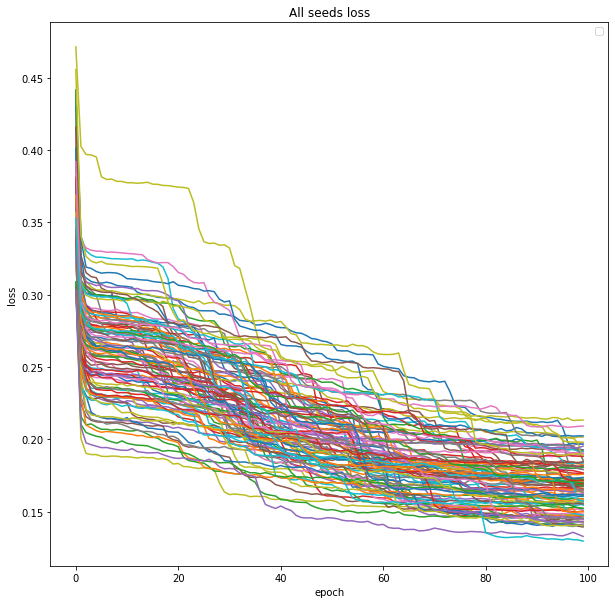

In [ ]:
print("training loss")
plot_seeds(train_loss_1)

Mean Training Loss


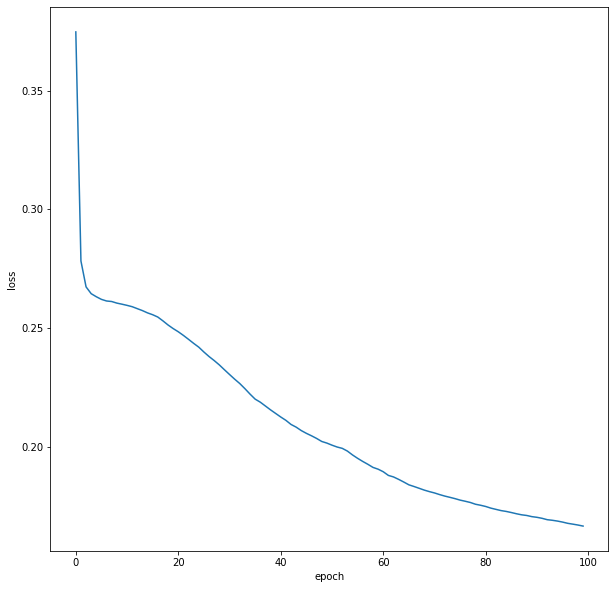

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_1_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


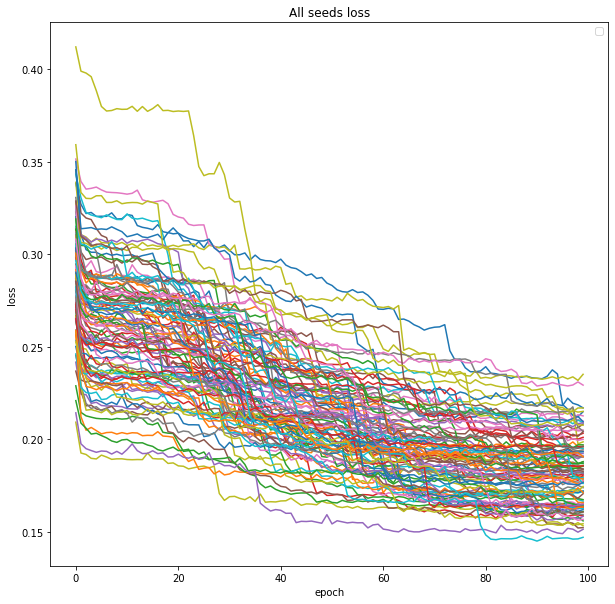

In [ ]:
print("testing loss")
plot_seeds(test_loss_1)

Mean Test Loss


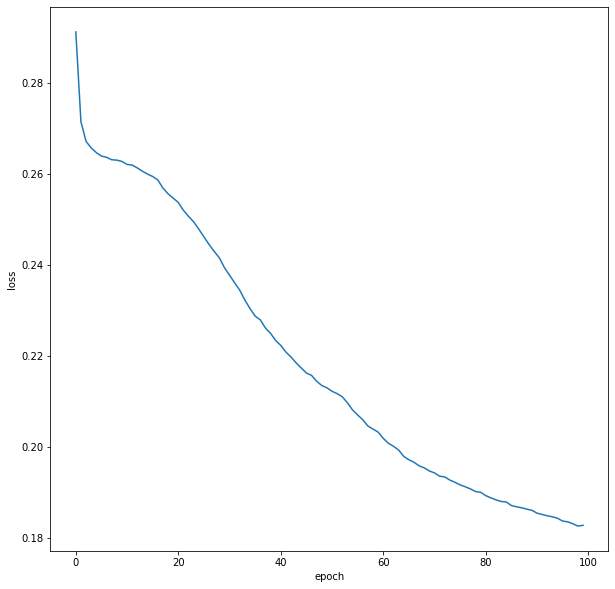

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_1_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 2

It is made of 4 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_2_training = simulation_processing(train_loss_2)
model_2_testing = simulation_processing(test_loss_2)

In [ ]:
model_2_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.371276,0.381270,0.326796,0.359555,0.347359,0.405189,0.431047,0.422637,0.381101,0.376993,...,0.390332,0.424245,0.371730,0.373194,0.396743,0.364941,0.310181,0.464150,0.386431,0.033937
1,0.278620,0.293315,0.241182,0.279308,0.255984,0.327865,0.314937,0.299631,0.280460,0.296475,...,0.294459,0.323682,0.280413,0.288582,0.292111,0.269370,0.215070,0.376135,0.286553,0.032645
2,0.273415,0.286156,0.237047,0.276242,0.250924,0.323775,0.305116,0.273828,0.272851,0.288739,...,0.289567,0.318626,0.272582,0.282997,0.286189,0.262658,0.210852,0.369010,0.278169,0.031490
3,0.270348,0.285591,0.236064,0.274814,0.249932,0.321902,0.294725,0.271156,0.271327,0.268979,...,0.289061,0.317467,0.270182,0.282263,0.285946,0.261767,0.210231,0.367423,0.275482,0.031094
4,0.268865,0.285431,0.235990,0.274979,0.249971,0.321007,0.293265,0.270471,0.271702,0.256368,...,0.289050,0.315663,0.265529,0.281969,0.285271,0.261220,0.208613,0.366783,0.274382,0.031179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.177930,0.168774,0.147569,0.192415,0.147405,0.181025,0.142966,0.152975,0.152702,0.155252,...,0.142859,0.206733,0.146164,0.139008,0.153345,0.180260,0.136336,0.225726,0.166137,0.019193
96,0.177250,0.169169,0.147307,0.192472,0.146733,0.173343,0.142844,0.152784,0.151683,0.155589,...,0.143019,0.207355,0.145659,0.139259,0.152817,0.180079,0.135282,0.225543,0.165732,0.019150
97,0.177416,0.168635,0.147045,0.192633,0.146733,0.172489,0.144206,0.153181,0.152411,0.155200,...,0.142572,0.207515,0.145316,0.138680,0.152326,0.178777,0.135837,0.224914,0.165342,0.018922
98,0.175224,0.168652,0.146905,0.191420,0.147119,0.171717,0.143663,0.151874,0.151514,0.155065,...,0.142658,0.206259,0.144453,0.138552,0.152621,0.177996,0.135295,0.225518,0.164964,0.018997


In [ ]:
model_2_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.285827,0.301386,0.243738,0.283685,0.264198,0.333895,0.339607,0.331446,0.288165,0.307863,...,0.298903,0.341374,0.287365,0.303455,0.295053,0.276173,0.224659,0.382889,0.297482,0.034015
1,0.276780,0.288683,0.232001,0.274136,0.255355,0.325306,0.309736,0.282636,0.277228,0.293114,...,0.290315,0.326703,0.274254,0.289518,0.284787,0.258199,0.212536,0.376530,0.281271,0.032524
2,0.272238,0.287862,0.231851,0.273271,0.252890,0.324592,0.298576,0.273259,0.274130,0.284183,...,0.287360,0.324968,0.270255,0.286501,0.285857,0.256988,0.211826,0.374081,0.277509,0.032032
3,0.273632,0.287810,0.231753,0.272511,0.252530,0.324016,0.295789,0.272519,0.273632,0.257354,...,0.289438,0.324334,0.267322,0.288967,0.281379,0.256112,0.211391,0.372122,0.275982,0.031952
4,0.270920,0.288964,0.230901,0.272624,0.253939,0.324441,0.295971,0.275441,0.273510,0.255763,...,0.285805,0.323903,0.263830,0.286745,0.283018,0.255290,0.212095,0.371812,0.275629,0.031906
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.193216,0.184555,0.161116,0.202686,0.163876,0.193187,0.161484,0.174165,0.169459,0.174102,...,0.160667,0.223431,0.166323,0.161405,0.166465,0.192918,0.151005,0.242975,0.182768,0.018410
96,0.193562,0.185076,0.160521,0.204653,0.164079,0.190803,0.163077,0.173085,0.171383,0.173292,...,0.161046,0.224948,0.168246,0.162344,0.166275,0.193177,0.150636,0.242785,0.182569,0.018276
97,0.192354,0.185969,0.160486,0.202872,0.163446,0.187661,0.161656,0.174265,0.169715,0.174067,...,0.161444,0.223252,0.167608,0.160905,0.167895,0.189616,0.150042,0.242673,0.182286,0.018299
98,0.190346,0.184107,0.161168,0.201248,0.165313,0.188445,0.161920,0.170731,0.170077,0.175276,...,0.161626,0.223410,0.165599,0.161392,0.168465,0.191164,0.152086,0.243955,0.181947,0.018224


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_2

[0.0831467557576266,
 0.08722311816350807,
 0.047795271422184274,
 0.13811912214459188,
 0.04377343203350664,
 0.06716321500753297,
 0.04000560528862773,
 0.046032659332113555,
 0.0539909673902698,
 0.07934715062226216,
 0.11084576852840597,
 0.07094480420440441,
 0.054845815749268556,
 0.05566229756798628,
 0.10773073603446964,
 0.07158606944602228,
 0.15120766627489204,
 0.046779983701440334,
 0.062315881689980174,
 0.10651695070334793,
 0.04863337186361516,
 0.086282162378771,
 0.04300097712329309,
 0.04097483335583361,
 0.0680941481371495,
 0.0684322447746829,
 0.05978409821877273,
 0.04267931920841574,
 0.15280209957334645,
 0.06759561293692885,
 0.08098509111678012,
 0.07762776028830212,
 0.041717278423876444,
 0.039728657942898135,
 0.0415656567293793,
 0.03837321008636599,
 0.06107655028706378,
 0.09747069650826119,
 0.04095366150046921,
 0.04152900355359541,
 0.0809333429720519,
 0.05056852421526278,
 0.04668825549342011,
 0.07718152985349094,
 0.04644694275433421,
 0.07560946

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


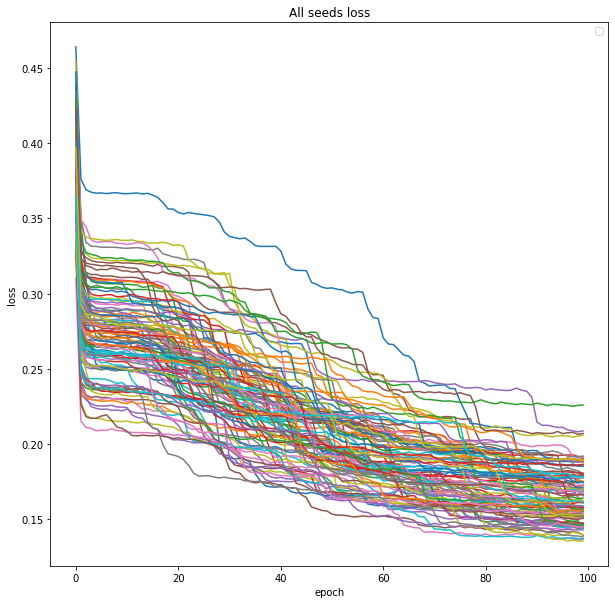

In [ ]:
print("training loss")
plot_seeds(train_loss_2)

Mean Training Loss


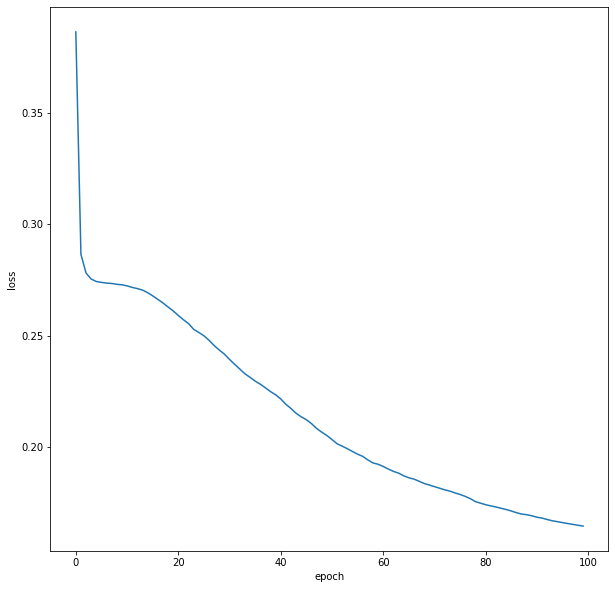

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_2_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


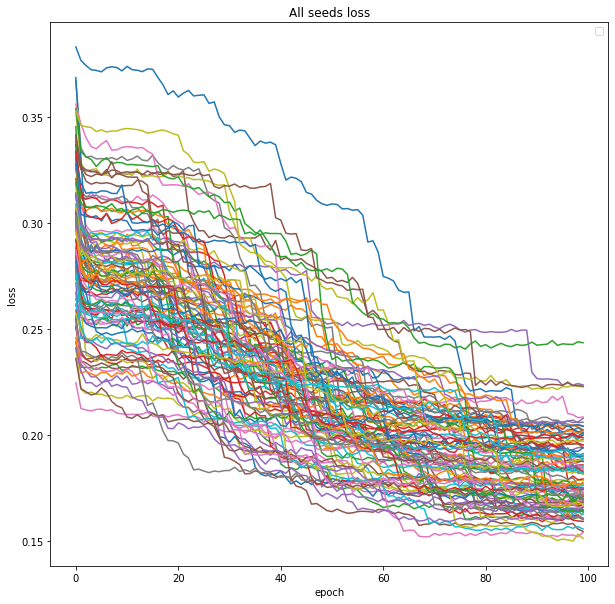

In [ ]:
print("testing loss")
plot_seeds(test_loss_2)

Mean Test Loss


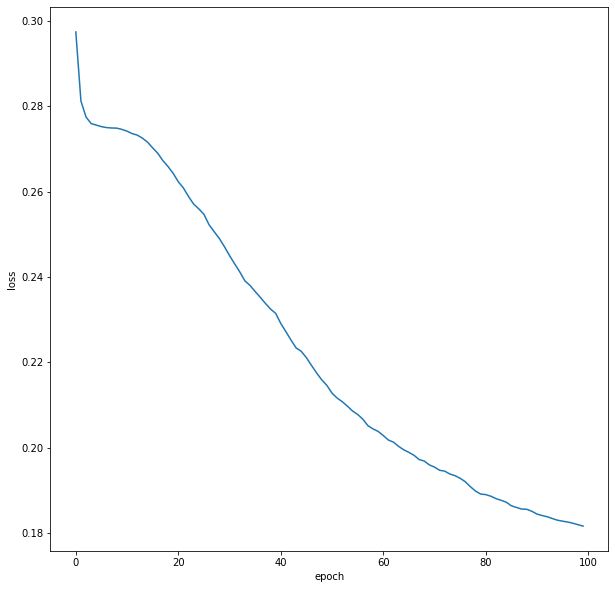

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_2_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 3

It is made of 5 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 25 neural with ReLU Activation
* Layer4 : 50 neural with ReLU Activation
* Layer5 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_3_training = simulation_processing(train_loss_3)
model_3_testing = simulation_processing(test_loss_3)

In [ ]:
model_3_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.403018,0.387447,0.368076,0.364446,0.380672,0.384568,0.346228,0.415723,0.398564,0.389281,...,0.422109,0.467056,0.399253,0.361971,0.424786,0.326567,0.319039,0.526739,0.401240,0.040316
1,0.299991,0.277762,0.291715,0.256730,0.289783,0.285222,0.236621,0.280766,0.304760,0.295523,...,0.321378,0.371639,0.316446,0.250473,0.317159,0.244322,0.222601,0.438632,0.298944,0.042130
2,0.291118,0.272643,0.285260,0.252194,0.285130,0.277047,0.231485,0.273076,0.298959,0.278845,...,0.314985,0.360527,0.312772,0.245664,0.312267,0.239768,0.219493,0.421117,0.289990,0.041174
3,0.288987,0.271163,0.284557,0.251396,0.284035,0.274910,0.230206,0.272513,0.298831,0.276925,...,0.313222,0.358846,0.311121,0.241345,0.310974,0.239163,0.218640,0.405284,0.287457,0.040610
4,0.287627,0.271702,0.284205,0.250770,0.283513,0.274634,0.230068,0.271433,0.297758,0.276260,...,0.313209,0.358927,0.311375,0.240979,0.310525,0.239119,0.215672,0.392343,0.286422,0.040090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.154753,0.166697,0.185400,0.162806,0.143520,0.176420,0.179846,0.206440,0.170907,0.185453,...,0.183369,0.222549,0.227772,0.145848,0.247920,0.148306,0.143231,0.247920,0.185203,0.026624
96,0.154135,0.166478,0.184413,0.162331,0.143798,0.176141,0.178525,0.207072,0.170445,0.185107,...,0.179882,0.221983,0.227689,0.145826,0.247269,0.148195,0.143354,0.247269,0.184435,0.026579
97,0.152421,0.166313,0.183375,0.161462,0.144274,0.175279,0.178190,0.207140,0.169645,0.180367,...,0.178598,0.222032,0.228060,0.146467,0.247009,0.148479,0.144048,0.247009,0.184079,0.026538
98,0.150225,0.166325,0.183585,0.162231,0.143226,0.172942,0.177788,0.206362,0.166354,0.171230,...,0.178231,0.222043,0.227829,0.146138,0.246880,0.147719,0.142484,0.246880,0.183433,0.026571


In [ ]:
model_3_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.301612,0.286520,0.297830,0.265358,0.299836,0.293736,0.243630,0.290758,0.313877,0.305535,...,0.327104,0.396742,0.325244,0.259894,0.319915,0.249725,0.229505,0.453846,0.309514,0.042825
1,0.291721,0.276499,0.286762,0.254377,0.287538,0.281663,0.234448,0.276750,0.301014,0.286448,...,0.317111,0.367350,0.312564,0.252817,0.312421,0.238130,0.218655,0.427769,0.293674,0.041564
2,0.286445,0.273518,0.284081,0.252657,0.285621,0.278371,0.233419,0.272503,0.300528,0.278676,...,0.313274,0.365512,0.312964,0.245072,0.311503,0.237373,0.215718,0.412450,0.288912,0.041125
3,0.287086,0.274436,0.282872,0.250989,0.283627,0.276404,0.233098,0.272661,0.301053,0.276490,...,0.311015,0.365442,0.313280,0.243535,0.310744,0.237390,0.214748,0.401132,0.287876,0.040719
4,0.289286,0.273857,0.282881,0.251431,0.283711,0.275506,0.232537,0.273179,0.300168,0.277556,...,0.310600,0.364375,0.312703,0.245064,0.311887,0.237852,0.214726,0.393964,0.287517,0.040489
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.170270,0.183338,0.191411,0.175792,0.158284,0.191727,0.195732,0.221262,0.185953,0.202678,...,0.188295,0.234293,0.238096,0.164946,0.257788,0.161087,0.158284,0.257788,0.198313,0.025218
96,0.171314,0.182952,0.191628,0.176308,0.157171,0.191981,0.194965,0.221740,0.185417,0.202608,...,0.187011,0.233208,0.239461,0.165858,0.257865,0.161478,0.157171,0.257865,0.198055,0.025111
97,0.167652,0.184129,0.191339,0.177911,0.155771,0.188888,0.195907,0.221530,0.185360,0.189529,...,0.184318,0.233856,0.238757,0.165213,0.257706,0.160194,0.155771,0.257706,0.197556,0.025332
98,0.167661,0.182219,0.191599,0.176960,0.155532,0.188545,0.194776,0.222045,0.180929,0.190047,...,0.183866,0.234700,0.237765,0.168781,0.257996,0.160541,0.155532,0.257996,0.197053,0.025208


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_3

[0.05483502611894524,
 0.056281473933388684,
 0.07568694031594302,
 0.05824922639157622,
 0.037051883208445775,
 0.06705305739276941,
 0.07792079919238933,
 0.14348869971901826,
 0.0577509764112022,
 0.0765142182249031,
 0.11983528812356531,
 0.14088335583528522,
 0.04199520258771641,
 0.07732033209380446,
 0.09291298019470118,
 0.2127289004503476,
 0.1041253682642494,
 0.10519792889794777,
 0.09985333378527354,
 0.09708187038974964,
 0.045296588352577015,
 0.20289098179790957,
 0.0699843092597085,
 0.07114432067174967,
 0.048714296031955706,
 0.05596071333850567,
 0.12054888054036512,
 0.08901759072008397,
 0.15805453534426087,
 0.15628547660185071,
 0.15049036328778206,
 0.055983647507450766,
 0.05810421478487638,
 0.06891450968211964,
 0.06340070593528548,
 0.058259562743047354,
 0.0652329672930047,
 0.0830264063792596,
 0.13376058814403438,
 0.057096506302994114,
 0.0520109481455041,
 0.09070215202249189,
 0.18199593695353497,
 0.14943174373504228,
 0.08966700738937573,
 0.14474193

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


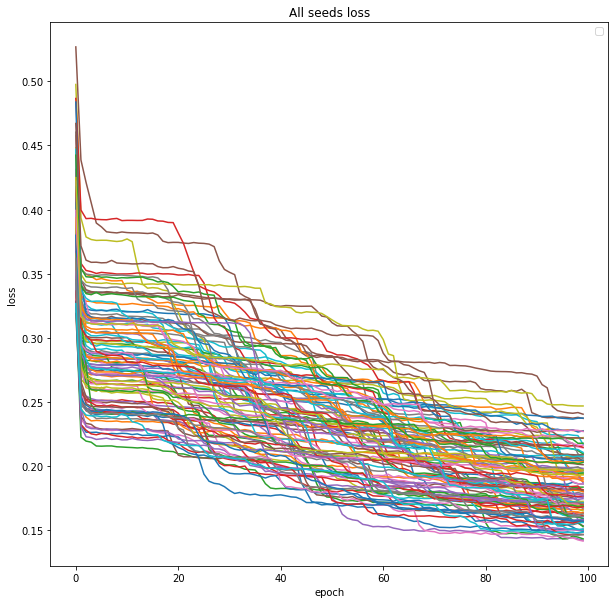

In [ ]:
print("training loss")
plot_seeds(train_loss_3)

Mean Training Loss


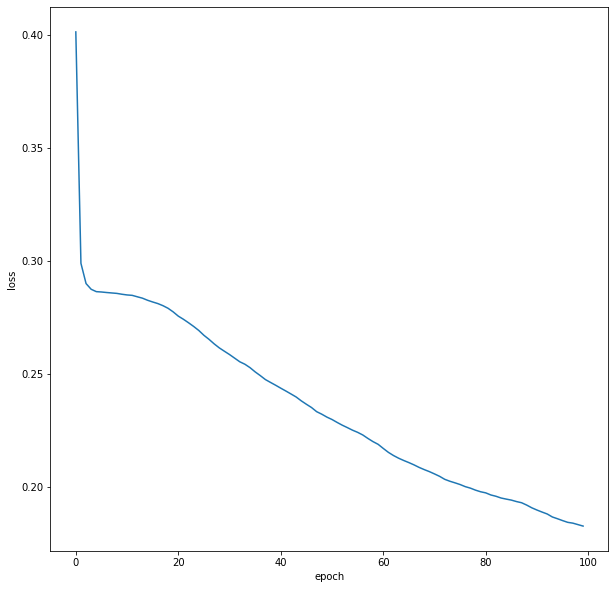

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_3_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


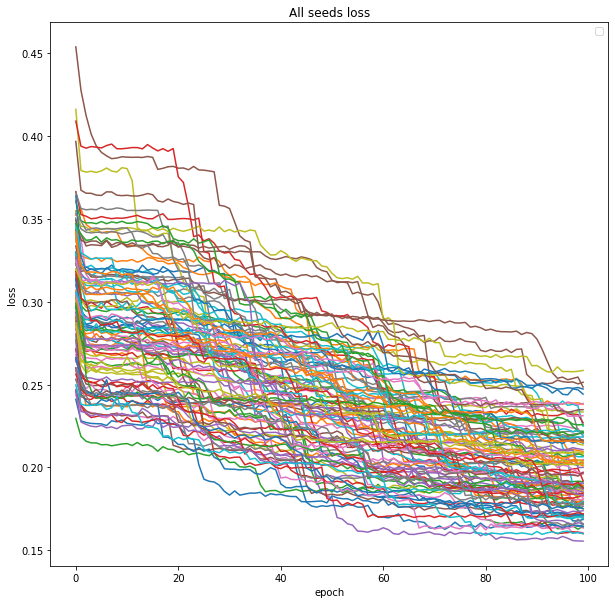

In [ ]:
print("testing loss")
plot_seeds(test_loss_3)

Mean Test Loss


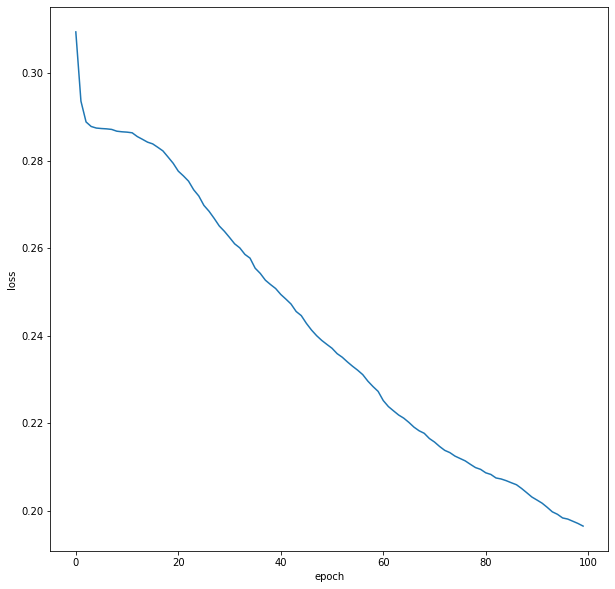

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_3_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 4

It is made of 6 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 25 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 50 neural with ReLU Activation
* Layer6 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_4_training = simulation_processing(train_loss_4)
model_4_testing = simulation_processing(test_loss_4)

In [ ]:
model_4_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.387117,0.363692,0.431710,0.387181,0.372499,0.394109,0.456996,0.445009,0.340916,0.373832,...,0.421620,0.409767,0.403897,0.349438,0.378852,0.349093,0.328348,0.527987,0.402067,0.039673
1,0.279974,0.264092,0.357737,0.306359,0.280183,0.302522,0.336624,0.324661,0.264627,0.289965,...,0.322746,0.317772,0.321144,0.263571,0.288412,0.238124,0.219506,0.398076,0.304554,0.037063
2,0.267227,0.253708,0.351581,0.301931,0.274991,0.295891,0.327447,0.310178,0.258644,0.285325,...,0.316415,0.312888,0.315752,0.254663,0.284170,0.223350,0.208724,0.382630,0.296304,0.036884
3,0.265863,0.253263,0.347974,0.301229,0.273429,0.295369,0.327822,0.308698,0.255636,0.284850,...,0.315999,0.310806,0.315957,0.252474,0.282553,0.221798,0.207481,0.381439,0.294756,0.036615
4,0.266089,0.251747,0.344858,0.300906,0.273281,0.295350,0.327357,0.309432,0.254221,0.284300,...,0.315208,0.310838,0.316759,0.251922,0.282160,0.221654,0.207047,0.381449,0.294189,0.036256
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.186804,0.192058,0.191815,0.158515,0.192779,0.234934,0.260751,0.178243,0.205705,0.164892,...,0.197298,0.227853,0.233921,0.145349,0.230735,0.163973,0.141719,0.260751,0.191259,0.028429
96,0.185962,0.192167,0.191585,0.158193,0.193574,0.234914,0.260206,0.180168,0.204856,0.164877,...,0.196745,0.227713,0.233560,0.146080,0.230495,0.162177,0.140970,0.260206,0.190513,0.028246
97,0.184465,0.190974,0.191221,0.155970,0.193077,0.234922,0.259026,0.179396,0.201065,0.165004,...,0.196296,0.227953,0.228429,0.144152,0.229852,0.162881,0.139299,0.259026,0.189641,0.028427
98,0.183753,0.190481,0.182774,0.154100,0.191785,0.235114,0.258152,0.178205,0.199784,0.165020,...,0.196348,0.227123,0.226911,0.143216,0.230129,0.162372,0.138490,0.258152,0.188828,0.028345


In [ ]:
model_4_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.299593,0.274820,0.359063,0.314689,0.290589,0.319789,0.355628,0.341596,0.272677,0.296035,...,0.322330,0.322858,0.332464,0.272648,0.292709,0.246066,0.231036,0.425686,0.314938,0.037707
1,0.269800,0.254899,0.349923,0.302298,0.281562,0.301971,0.333322,0.317403,0.261610,0.283688,...,0.315022,0.318974,0.314353,0.262294,0.285962,0.222859,0.212722,0.384857,0.299445,0.036812
2,0.269555,0.255140,0.347039,0.300444,0.278659,0.300471,0.330579,0.313367,0.261427,0.283548,...,0.312375,0.314608,0.313781,0.257606,0.282464,0.220923,0.207773,0.383410,0.296467,0.036406
3,0.267370,0.253760,0.343670,0.300922,0.276398,0.302575,0.331499,0.312973,0.257059,0.283863,...,0.311968,0.312058,0.315538,0.256250,0.283765,0.218499,0.208002,0.383942,0.295840,0.036297
4,0.266951,0.252950,0.342144,0.301609,0.278786,0.302147,0.332572,0.313616,0.256013,0.283451,...,0.310686,0.310568,0.319233,0.257857,0.282962,0.216963,0.207363,0.384263,0.295380,0.036165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.199279,0.204849,0.195252,0.166577,0.205879,0.245595,0.274810,0.193867,0.214285,0.181690,...,0.202179,0.233769,0.241682,0.163338,0.241098,0.168759,0.154429,0.274810,0.202799,0.027761
96,0.198787,0.202105,0.195033,0.167602,0.204479,0.245462,0.274396,0.193804,0.209909,0.180822,...,0.201817,0.236365,0.238243,0.158441,0.241289,0.168484,0.153005,0.274396,0.202101,0.027822
97,0.199071,0.201649,0.189672,0.162679,0.204751,0.246051,0.274080,0.193783,0.209922,0.181171,...,0.203258,0.234309,0.233859,0.159600,0.240720,0.168469,0.151762,0.274080,0.201637,0.028000
98,0.196220,0.201174,0.186252,0.163320,0.204180,0.245714,0.272156,0.192932,0.209711,0.181553,...,0.202113,0.234543,0.234002,0.158940,0.241432,0.168085,0.152535,0.272156,0.200803,0.027752


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_4

[0.08005805158341146,
 0.08373275240188702,
 0.07619306471289267,
 0.041502299821800995,
 0.11021745599054471,
 0.16316193817409994,
 0.24439011832629773,
 0.07694112147765769,
 0.09242406527099112,
 0.06730617290938418,
 0.1517796460920172,
 0.12181594475259619,
 0.056229124334235436,
 0.06177858487117722,
 0.17293182219518452,
 0.15160244689055943,
 0.19317619027272478,
 0.04788527409780166,
 0.052284010665664855,
 0.09944320514901855,
 0.03968138079584235,
 0.10281569452324803,
 0.17652978091878732,
 0.06155815783730103,
 0.06809541961278702,
 0.05857007186739138,
 0.13138549273092534,
 0.10195018452159837,
 0.10508319756258251,
 0.19150321136678997,
 0.12594993502822469,
 0.10422601310193842,
 0.09163385796109175,
 0.1304667951260204,
 0.07215207291358988,
 0.10162735411193205,
 0.09146054909938765,
 0.16221090223470816,
 0.10898849079623714,
 0.1743858744366416,
 0.047784932135768454,
 0.09416544709016408,
 0.07478957405160878,
 0.08875415355822745,
 0.049441213948863645,
 0.07019

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


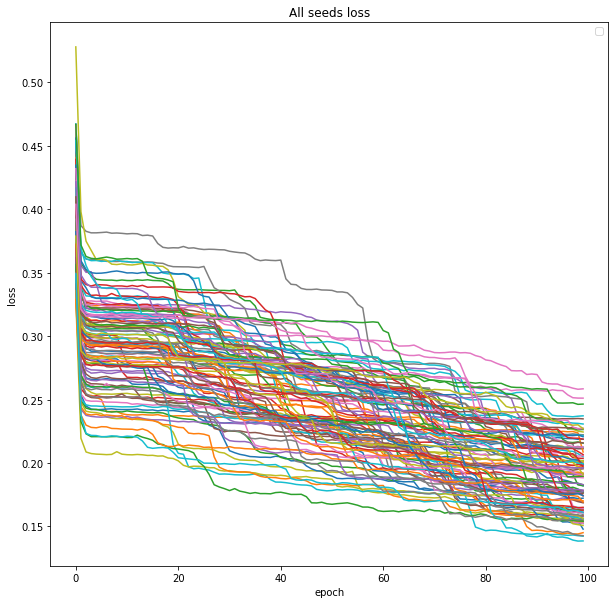

In [ ]:
print("training loss")
plot_seeds(train_loss_4)

Mean Training Loss


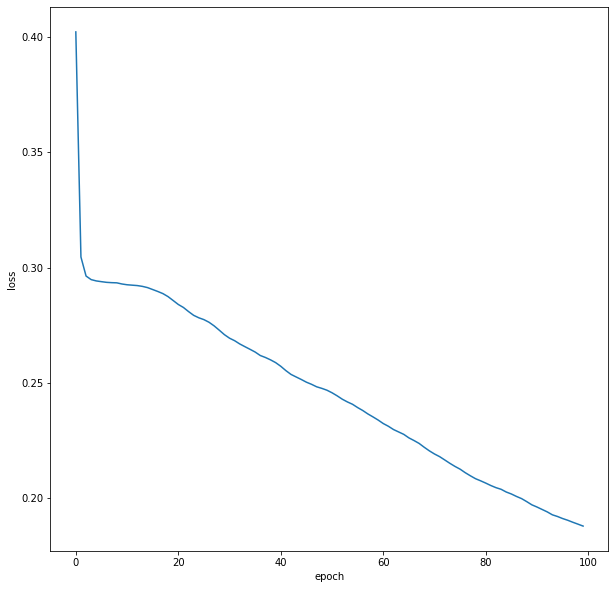

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_4_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


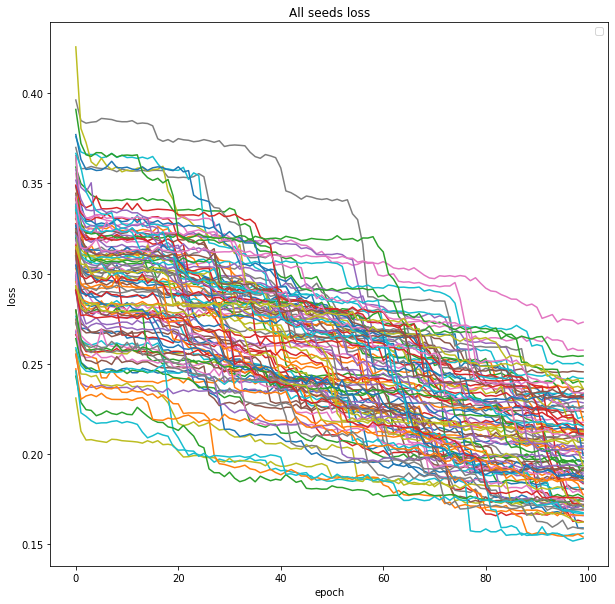

In [ ]:
print("testing loss")
plot_seeds(test_loss_4)

Mean Test Loss


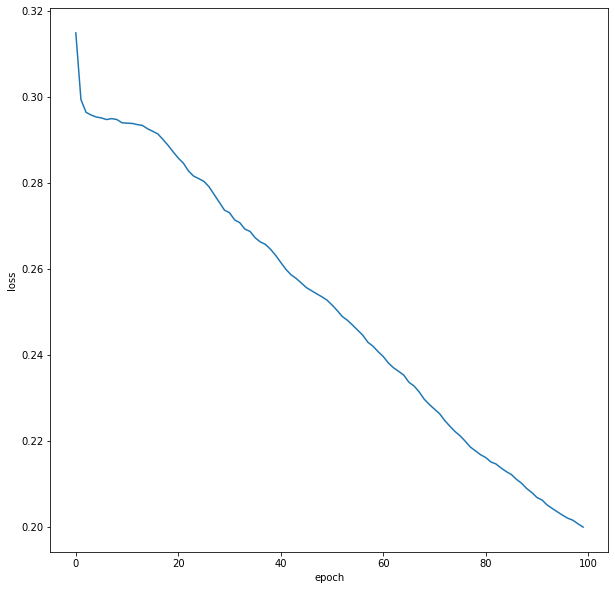

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_4_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 5

It is made of 7 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 75 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 50 neural with ReLU Activation
* Layer6 : 75 neural with ReLU Activation
* Layer7 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_5_training = simulation_processing(train_loss_5)
model_5_testing = simulation_processing(test_loss_5)

In [ ]:
model_5_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.437084,0.472239,0.378946,0.357847,0.379305,0.387483,0.373763,0.451313,0.401558,0.356379,...,0.361905,0.478928,0.432327,0.422360,0.416204,0.411242,0.311008,0.515371,0.413278,0.043502
1,0.348665,0.283604,0.303429,0.270009,0.273791,0.267184,0.256090,0.343263,0.268827,0.255997,...,0.222105,0.308099,0.304684,0.308025,0.309108,0.312723,0.222105,0.389750,0.299566,0.038833
2,0.345296,0.271367,0.296423,0.259489,0.268515,0.262177,0.244666,0.329827,0.258338,0.251885,...,0.213429,0.300804,0.298670,0.298030,0.298998,0.307957,0.213429,0.370710,0.290425,0.038244
3,0.343788,0.268310,0.295066,0.253797,0.267916,0.260668,0.243327,0.328248,0.256220,0.250997,...,0.213211,0.299164,0.296371,0.296227,0.297396,0.306589,0.213211,0.367508,0.288671,0.037995
4,0.345883,0.268191,0.294504,0.253028,0.267249,0.260328,0.243824,0.328283,0.255724,0.251112,...,0.206678,0.298747,0.296291,0.295991,0.296646,0.306749,0.206678,0.366606,0.288192,0.038330
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.193967,0.162756,0.168661,0.162951,0.153683,0.156352,0.160201,0.205826,0.167016,0.160490,...,0.161701,0.197136,0.233949,0.169209,0.178370,0.148466,0.133529,0.236137,0.175248,0.023565
96,0.192355,0.162839,0.168644,0.163801,0.153923,0.156940,0.159042,0.206537,0.163343,0.160058,...,0.160832,0.197472,0.234235,0.168364,0.173494,0.149156,0.133391,0.235850,0.174133,0.023229
97,0.192887,0.161663,0.168385,0.163646,0.153282,0.159780,0.158165,0.206359,0.158539,0.159255,...,0.160507,0.196137,0.231781,0.167215,0.172856,0.148616,0.134467,0.235916,0.173116,0.022859
98,0.193348,0.161683,0.168539,0.163646,0.152965,0.156677,0.157572,0.206083,0.155310,0.158465,...,0.160208,0.196424,0.229215,0.168450,0.172875,0.148422,0.133096,0.234227,0.172051,0.022582


In [ ]:
model_5_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.362781,0.290574,0.307337,0.272324,0.283591,0.272749,0.272318,0.361831,0.291752,0.264551,...,0.234884,0.327765,0.315767,0.334896,0.330602,0.312938,0.226859,0.399547,0.310529,0.038432
1,0.352684,0.274583,0.296961,0.264139,0.274637,0.265664,0.247960,0.338494,0.268416,0.252489,...,0.213086,0.308264,0.296729,0.313310,0.299415,0.306803,0.213086,0.374289,0.292843,0.038678
2,0.349446,0.266305,0.291889,0.250510,0.272907,0.264755,0.246270,0.330572,0.260736,0.252139,...,0.211162,0.303603,0.295140,0.306722,0.295823,0.304873,0.211162,0.369314,0.289570,0.037899
3,0.351182,0.265056,0.291985,0.248281,0.271005,0.265241,0.247297,0.332049,0.260513,0.252084,...,0.209370,0.302212,0.294317,0.306920,0.294194,0.305241,0.209370,0.367860,0.288827,0.037962
4,0.348602,0.266630,0.291814,0.248745,0.271040,0.265313,0.247255,0.331213,0.263514,0.251768,...,0.202326,0.303549,0.295574,0.306554,0.293686,0.304667,0.202326,0.365970,0.288515,0.038322
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.204109,0.175712,0.173522,0.174849,0.165381,0.174522,0.174720,0.217619,0.178238,0.173734,...,0.170074,0.212724,0.243215,0.182705,0.191784,0.157033,0.145088,0.247195,0.187076,0.022854
96,0.205520,0.175549,0.173388,0.172929,0.162764,0.177129,0.175203,0.216382,0.172947,0.174856,...,0.170366,0.211580,0.243103,0.180772,0.189597,0.155890,0.147602,0.245603,0.186227,0.022366
97,0.204056,0.175622,0.173857,0.175298,0.163106,0.174881,0.174066,0.215796,0.165978,0.174708,...,0.169281,0.212961,0.239772,0.181379,0.190182,0.157199,0.146307,0.243942,0.185242,0.021764
98,0.203699,0.173860,0.173188,0.175010,0.162712,0.175352,0.174531,0.216247,0.165119,0.174960,...,0.169292,0.213173,0.238218,0.180629,0.188875,0.159433,0.146281,0.244289,0.184454,0.021828


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_5

[0.10749085124936428,
 0.048058801695439614,
 0.057717258926738665,
 0.06240660416998895,
 0.04285311132368234,
 0.05321361921709118,
 0.05475749319239237,
 0.10598296422976321,
 0.049333604677764854,
 0.05673684392767193,
 0.07294904321430294,
 0.19132402474603893,
 0.05018839869094254,
 0.04094241293658382,
 0.11472607208484681,
 0.1060665376792404,
 0.05622308660217624,
 0.06611690898926477,
 0.04083882475480699,
 0.05316774243810429,
 0.06910886456215437,
 0.12375393512017074,
 0.09009642875638375,
 0.0990010065828857,
 0.04726783735872745,
 0.040339942644050594,
 0.07694837213876707,
 0.04577076717266143,
 0.06658811875701065,
 0.04079815434336078,
 0.05004400552619922,
 0.06897949732354476,
 0.03723639290254239,
 0.05925385356996691,
 0.042706010210889024,
 0.05004025036926845,
 0.04101808205754047,
 0.2080465646390687,
 0.08708372519026032,
 0.0559553113017678,
 0.10393095103855739,
 0.07545350992331394,
 0.07168003119741762,
 0.07335246888098207,
 0.16360530758142336,
 0.082296

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


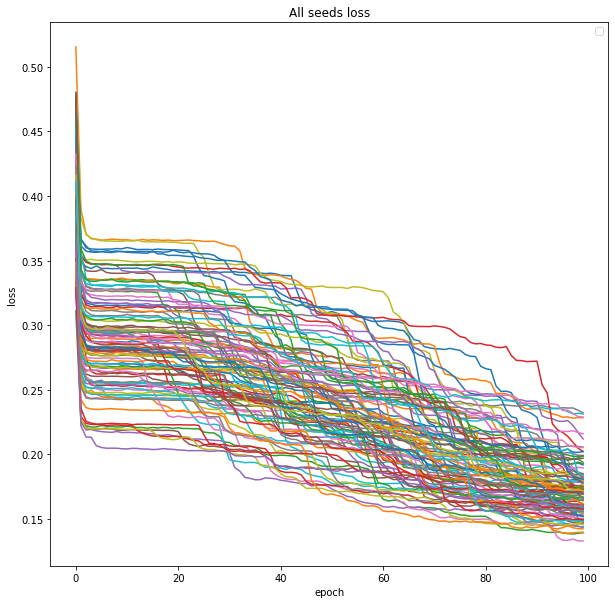

In [ ]:
print("training loss")
plot_seeds(train_loss_5)

Mean Training Loss


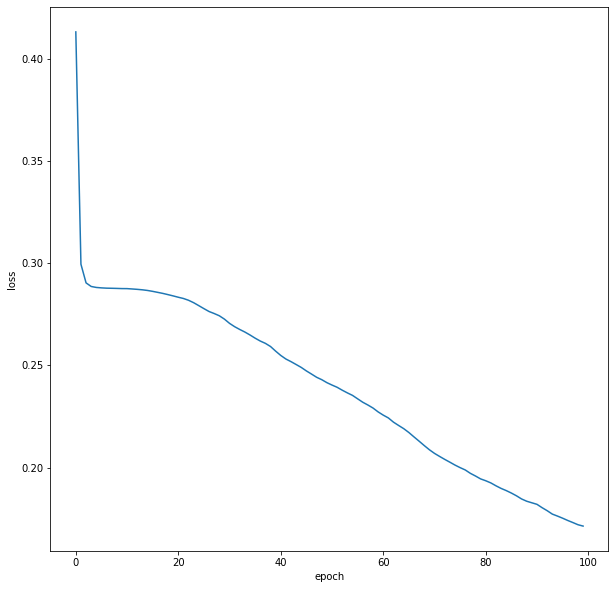

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_5_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


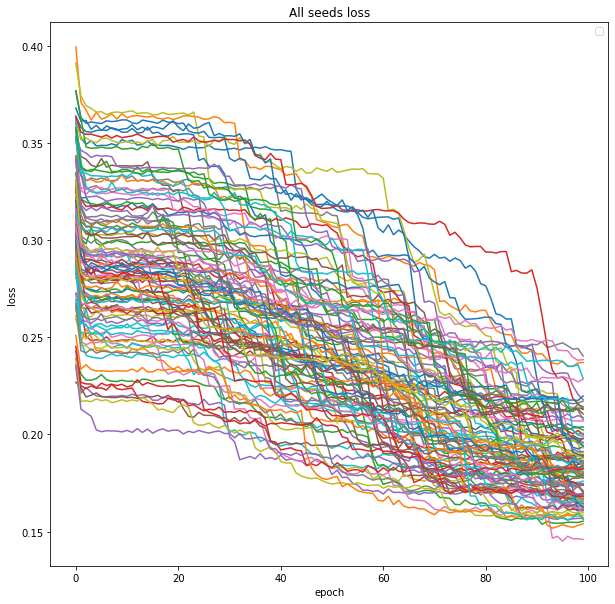

In [ ]:
print("testing loss")
plot_seeds(test_loss_5)

Mean Test Loss


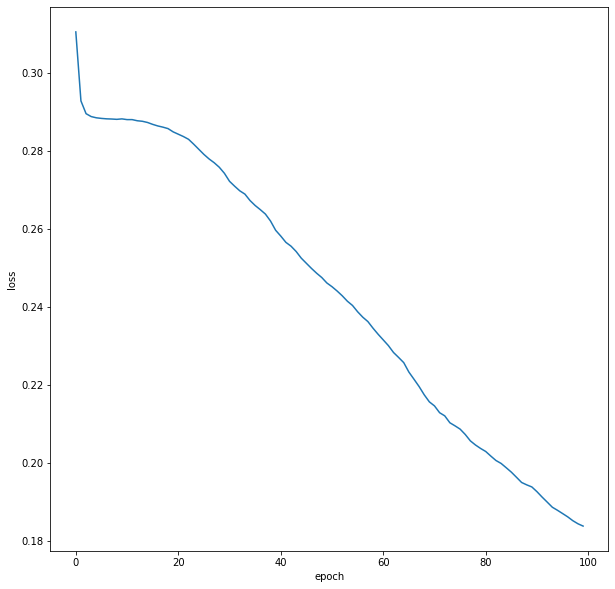

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_5_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 6

It is made of 8 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 75 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 25 neural with ReLU Activation
* Layer6 : 50 neural with ReLU Activation
* Layer7 : 75 neural with ReLU Activation
* Layer8 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_6_training = simulation_processing(train_loss_6)
model_6_testing = simulation_processing(test_loss_6)

In [ ]:
model_6_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.451423,0.402899,0.370591,0.378524,0.367083,0.388253,0.374973,0.382319,0.335341,0.462639,...,0.367965,0.406367,0.396774,0.382791,0.450030,0.383014,0.333551,0.519820,0.414394,0.042656
1,0.271049,0.296102,0.269399,0.278298,0.272744,0.280155,0.254055,0.263540,0.230891,0.352455,...,0.275372,0.294900,0.280867,0.259658,0.340961,0.248753,0.225167,0.395388,0.301775,0.037877
2,0.249706,0.289064,0.258754,0.271475,0.266878,0.270140,0.245322,0.253782,0.222031,0.344855,...,0.266447,0.287611,0.272851,0.247982,0.336588,0.242346,0.218967,0.390943,0.293020,0.037588
3,0.248369,0.288364,0.257055,0.270190,0.265812,0.268586,0.243746,0.252567,0.220405,0.343469,...,0.265287,0.286612,0.264719,0.238402,0.334643,0.241991,0.219169,0.390041,0.291364,0.037550
4,0.247698,0.287692,0.256834,0.270348,0.265332,0.268512,0.243461,0.250964,0.220633,0.343248,...,0.265092,0.286640,0.261253,0.237521,0.334534,0.241278,0.218854,0.390251,0.291079,0.037647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.208986,0.170609,0.187584,0.163124,0.163998,0.224433,0.199502,0.189580,0.162136,0.236417,...,0.147236,0.205213,0.176051,0.195184,0.196219,0.166438,0.147236,0.275133,0.196255,0.028446
96,0.197778,0.166904,0.187726,0.162941,0.163707,0.223261,0.199205,0.188836,0.161491,0.234350,...,0.147745,0.204725,0.174255,0.195087,0.189325,0.166279,0.147745,0.274661,0.194791,0.028164
97,0.194099,0.165341,0.187964,0.162522,0.162504,0.221972,0.198702,0.188901,0.161121,0.233783,...,0.146970,0.203002,0.172864,0.194492,0.187965,0.166254,0.145940,0.274066,0.193282,0.027640
98,0.192693,0.165145,0.187289,0.161752,0.162535,0.221858,0.198032,0.189174,0.162627,0.225524,...,0.146847,0.202824,0.170242,0.194466,0.182520,0.165827,0.143783,0.273308,0.192173,0.027237


In [ ]:
model_6_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.299408,0.299685,0.274797,0.286304,0.294398,0.291910,0.260924,0.280536,0.250558,0.358694,...,0.287327,0.300350,0.295037,0.274567,0.347628,0.260918,0.239638,0.414206,0.313060,0.038305
1,0.257817,0.284985,0.256097,0.270510,0.272821,0.275474,0.254744,0.255845,0.226817,0.342089,...,0.264312,0.295189,0.276265,0.258523,0.345707,0.242121,0.223926,0.389320,0.295563,0.037609
2,0.249432,0.284630,0.251075,0.268826,0.271895,0.272794,0.247897,0.253154,0.228156,0.340878,...,0.261596,0.288168,0.273362,0.242924,0.340162,0.242133,0.222520,0.389285,0.292445,0.037289
3,0.250259,0.282827,0.251986,0.268298,0.271444,0.271757,0.248902,0.252943,0.226206,0.339866,...,0.261063,0.287738,0.263237,0.242299,0.340648,0.240351,0.222982,0.387364,0.291803,0.037346
4,0.250645,0.282550,0.250632,0.268641,0.270236,0.275068,0.248117,0.254413,0.227921,0.338045,...,0.261535,0.288582,0.261948,0.241225,0.340335,0.240628,0.222053,0.387864,0.291535,0.037312
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.210069,0.181196,0.191910,0.170596,0.172317,0.230626,0.212279,0.201137,0.173278,0.243527,...,0.158912,0.214476,0.185445,0.205416,0.200430,0.172336,0.158912,0.284982,0.204938,0.027635
96,0.210473,0.178432,0.191443,0.172779,0.173801,0.230294,0.210753,0.201638,0.171629,0.243781,...,0.158769,0.211463,0.184480,0.205041,0.200586,0.172827,0.157373,0.284669,0.203515,0.027331
97,0.203832,0.178712,0.192472,0.170765,0.171717,0.229484,0.211870,0.201823,0.171938,0.243527,...,0.159308,0.211535,0.182490,0.206047,0.201121,0.172195,0.154123,0.284559,0.202517,0.027023
98,0.204486,0.177462,0.192668,0.169471,0.171474,0.229421,0.211013,0.200514,0.172372,0.223799,...,0.159253,0.211257,0.184156,0.205458,0.194635,0.173622,0.153564,0.282851,0.201221,0.026213


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_6

[0.09865471764215297,
 0.064728359471192,
 0.07833059651788507,
 0.05265451226701436,
 0.04955609739961168,
 0.12565933056292405,
 0.12015692973033146,
 0.08556863660144458,
 0.04835508766982387,
 0.12754351543344344,
 0.051704250040748495,
 0.07239920998543675,
 0.05042248269706857,
 0.06872134165082847,
 0.1454564794877755,
 0.0647711259767711,
 0.14490568230892992,
 0.10424022782139922,
 0.08092981982459843,
 0.11889815072910168,
 0.077465101764181,
 0.0742919319696687,
 0.04433755275534445,
 0.1727359617574448,
 0.08768825422123433,
 0.12130582137617556,
 0.19272507134094788,
 0.13985183468376147,
 0.09499553286532818,
 0.08499814785196891,
 0.07279858289496347,
 0.14628167906680298,
 0.04372147733698723,
 0.08425382195792841,
 0.10424512687458048,
 0.05683607025605819,
 0.19644988384050308,
 0.17419220350776476,
 0.15603496374926748,
 0.13461756183967444,
 0.049926937118095545,
 0.13745234473308596,
 0.08349747422767397,
 0.107353939538051,
 0.062320327325341235,
 0.12008384022958

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


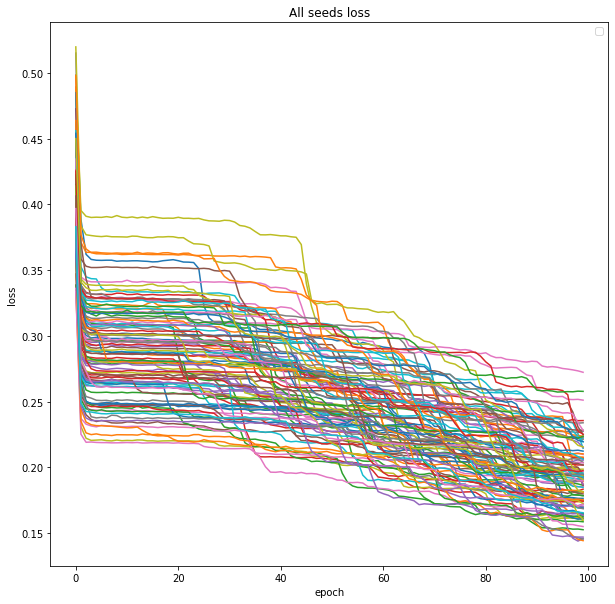

In [ ]:
print("training loss")
plot_seeds(train_loss_6)

Mean Training Loss


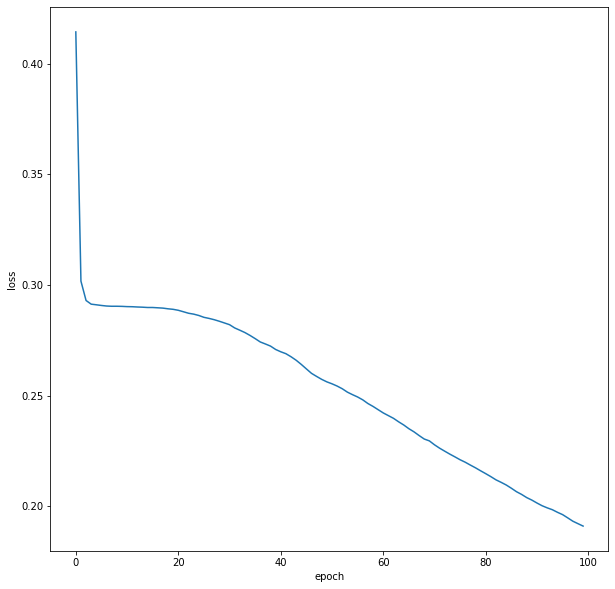

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_6_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


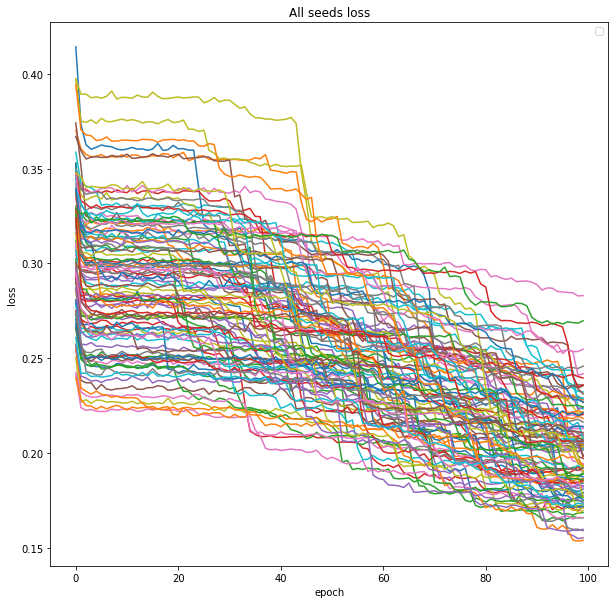

In [ ]:
print("testing loss")
plot_seeds(test_loss_6)

Mean Test Loss


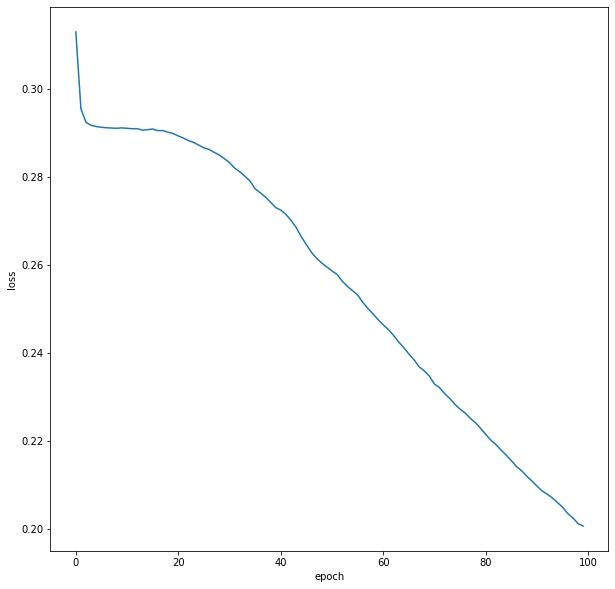

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_6_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Comparative Graph of all model



*   Training loss
*   Testing loss



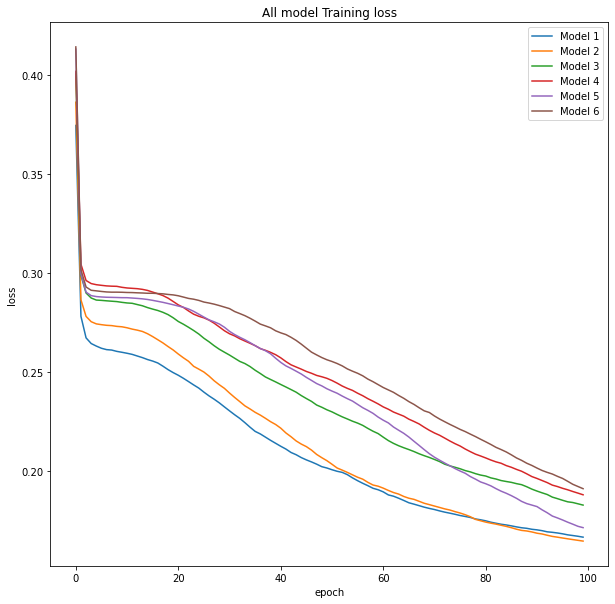

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(model_1_training.loc[:,'mean'], label = "Model 1")
plt.plot(model_2_training.loc[:,'mean'], label = "Model 2")
plt.plot(model_3_training.loc[:,'mean'], label = "Model 3")
plt.plot(model_4_training.loc[:,'mean'], label = "Model 4")
plt.plot(model_5_training.loc[:,'mean'], label = "Model 5")
plt.plot(model_6_training.loc[:,'mean'], label = "Model 6")
plt.title('All model Training loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
plt.show()

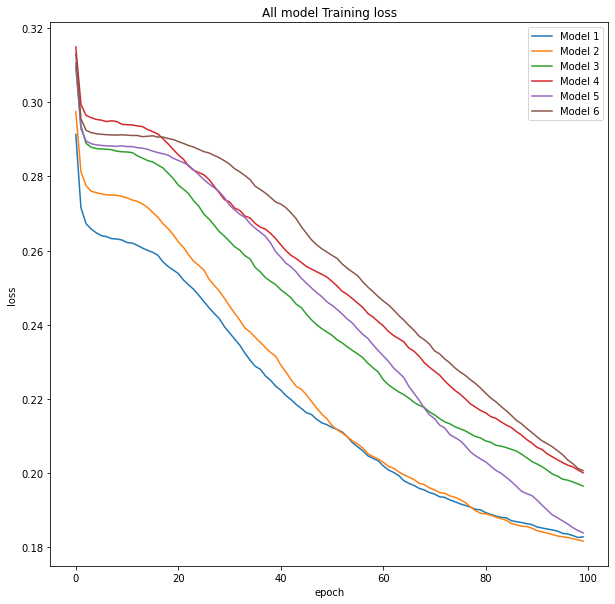

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(model_1_testing.loc[:,'mean'], label = "Model 1")
plt.plot(model_2_testing.loc[:,'mean'], label = "Model 2")
plt.plot(model_3_testing.loc[:,'mean'], label = "Model 3")
plt.plot(model_4_testing.loc[:,'mean'], label = "Model 4")
plt.plot(model_5_testing.loc[:,'mean'], label = "Model 5")
plt.plot(model_6_testing.loc[:,'mean'], label = "Model 6")
plt.title('All model Training loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
plt.show()